# CH04 금융 특성 공학: 알파 팩터 리서치

알고리즘 트레이딩 전략은 **벤치마크 대비 양의 수익률**을 내고자 **언제 자산을 매수 or 매도**해야 하는지 가리키는 **신호에 의해 결정**된다.

- 알파: 벤치마크에 대한 노출에 의해 설명되지 않는 자산의 수익률 부분
- 알파 팩터: 알파의 신호

4장에서 다루는 내용
- 존재하는 팩터의 범주, 작동 이유, 측정 방법
- 넘파이, 판다스, TA-Lib를 사용한 알파 팩터 생성
- 웨이블릿과 칼만 필터를 사용해 데이터 잡음을 제거하는 방법
- 오프라인 및 퀀토피안 플랫폼에서 집라인을 사용해 개별 및 다중 알파 팩터 테스트
- 여러 척도 중 정보 계수(IC)를 사용한 예측 성과 및 회전률을 평가하는 방법


## 알파 팩터 실무: 데이터부터 신호까지
- **알파 팩터**: **자산 가격의 움직임을 예측하는 것을 목표**로 하는 **원시 데이터의 변환**
    - 자산 수익률을 높이는 리스크를 포착하게 설계됨
    - 팩터는 하나 또는 여러 개의 입력 변수를 결합하지만 전략이 팩터를 평가할 때는 언제나 각 자산에 대해 단일 값을 취함
    - 트레이딩 결정은 여러 자산에 걸쳐 상대적 팩터 값이나 단일 자산에 대해 패턴에 의존함

- **알파 팩터 리서치와 실행 워크플로**
    - **리서치** *(4장)*
        1. **예측 데이터 수집**
        2. **투자 유니버스 정의**
        3. **알파 팩터 설계**
        4. **알파 팩터 결합**
    - 실행 *(5장)*
        1. 포트폴리오 최적화
        2. 트레이드 실행



### 알파 팩터 공학
- 알파 팩터: **예측 신호를 포함한 시장 데이터, 기본적 데이터와 대체 데이터를 변환한 것**
    - 성장률, 물가 상승률, 변동성, 생산성과 인구 통계적 리스크와 같은 기본적인 경제 전반의 거시 경제 데이터를 묘사한다.
    - 거래 가능하며 시장 가격에 의해 반영되는 가치-성장 투자 및 모멘텀 투자와 같은 투자 스타일을 표현한다.
    - 금융시장의 경제적 또는 제도적 설정 또는 투자자들의 편향을 포함한 투자자 행동을 기반으로 가격 움직임을 설명한다.


- **팩터가 일관성 있는 결과를 내도록 보장하려면 모멘텀, 가치, 변동성, 기업의 질과 같은 다양한 기존 팩터 범주와 관련 논리를 기반**으로 의미 있는 경제적 직관이 있어야 한다.
    - 합리성 기반 경제학: 팩터들이 나쁜 시기의 낮은 수익률을 보상하고자 장기적으로 높은 수익률을 가진다고 설명한다.
    - 행동 경제학: 팩터 리스크 프리미엄은 경제 주체의 편향을 가진 행동, 즉 완전히 합리적이지 않은 행동이 없어지지 않음으로부터 비롯된다고 설명한다.


알파 팩터는 변수의 시간에 따른 절대적 또는 상대적 변화, 데이터 시리즈 간의 비율, 단순 또는 지수 이동 평균과 같은 일정 기간 동안의 합계와 같은 단순한 산술적 연산을 사용해 원시 시장, 기본 또는 대체 데이터를 변환함으로써 생성된다.
- 공급에 대한 수요의 상대 강도 지표(relative strength index)와 같은 가격과 거래량 패턴의 기술적 분석 및 증권의 기본적 분석에 등장하는 척도들도 포함




## 수십 년간의 팩터 리서치를 바탕으로 구축
- 이상적인 리스크 팩터
    - 상호 독립적
    - 양의 리스크 프리미엄 창출
    - 리스크의 모든 차원을 생성해 완전한 집합 형성
    - 주어진 자산군의 자산의 체계적 리스크 설명 가능

여기서 금융 연구와 트레이딩 응용에서 유명한 몇 가지 주요 팩터 범주를 검토하고, 경제적 논리를 설명하고, 이들 수익률의 동인들을 포착하고자 전형적으로 사용하는 척도를 제시한다.



### 모멘텀과 심리: 추세는 당신의 친구다
- 모멘텀 투자
    - 모멘텀 팩터는 일정 기간에 걸쳐 성과가 좋은 자산들을 매수하고, 성과가 안 좋은 자산들을 공매도하도록 설계된다.
- 모멘텀 전략의 전제
    - 자산 가격이 양의 시계열 상관관계로 반영되는 추세
    - 가격 모멘텀은 과거 가격 수익률들만으로는 미래의 성과를 예측할 수 없다는 효율적 시장 가설을 부정
    - 가격 모멘텀은 여러 자산군에 걸쳐 양의 수익률을 보임

- 모멘텀 팩터는 HML(High-Minus-Low) 가치 팩터, RMW(Robust-Minus-Week) 수익성 팩터 CMA(Conservertive-Minus-Aggressive) 투자 팩터를 포함한다.
    - 주식 프리미엄은 시장 수익률(ex. S&P 500)과 무위험 이자율과의 차이이다.


#### 모멘텀과 심리가 초과 수익률을 낳는 이유
- 모멘텀 효과의 이유
1. 투자자의 행동
    - 행동 경제학적 이유: 투자자들이 새로운 정보를 상이한 속도로 소화하면서 나타나는 시장 뉴스에 대한 과소반응과 과대반응의 바이어스를 반영
2. 리스크 자산과 경제와의 양의 피드백 루프
    - 경제 성장은 주식시장을 상승시키고, 이에 따른 부의 효과는 더 높은 지출을 통해 경제로 재유입되고 이는 다시 성장을 촉진한다.
    - 음의 피드백이 리버설을 초래하는 채권, 외환, 상품이 훨씬 짧은 투자 기간을 요구하는 반면, 이러한 가격과 경제의 양의 피드백은 종종 주식과 신용 상품의 모멘텀을 장기로 연장시킨다.
3. 시장 마찰로 인한 지속적인 수요와 공급의 불균형
    - 상품 생산이 수요 추세에 적응하기 위해 상당한 시간이 걸린다.
    - 지속적인 공급 부족이 가격 상승 모멘텀을 유발하고 지지할 수 있다.
4. 시장 미시 구조
    - 투자자들은 손절매, 고정비율 포트폴리오 보험(CPPI), 동적 델타 헤징, 방어적 풋과 같은 옵션 기반 트레이딩 전략을 사용한다.
    - .이는 자산의 성과가 나쁠 때 매도하고 자산의 성과가 좋을 때 매수하도록 한 사전 약정을 의미하여 모멘텀을 초래한다.
    - 유사하게 리스크 패리티 전략도 좋은 성과를 보이는 변동성이 낮은 자산을 매수하고 음의 성과를 보이는 변동성이 높은 자산을 매도하는 경향이 있다.
        - 이를 사용하는 포트폴리오의 자동 리밸런싱은 가격 모멘텀을 강화한다.


#### 모멘텀과 심리를 측정하는 방법
모멘텀 팩터는 추세와 패턴을 식별하여 전통적인 가격 시계열 변화에서 도출된다.
이는 전통 자산군 내 또는 저통 자산군 간에, 그리고 여러 기간에서 자산을 횡단면적으로 비교하거나 자산의 시계열을 분석함으로써 절대적 수익률이나 상대적 수익률을 기반으로 구축될 수 있다.

- 모멘텀 지표

| 팩터 | 설명 | 공식 |
| --- | --- | --- |
| 상대 강도 지수 (RSI) | 주가 상승과 하락의 강도를 비교하여 추세의 강도를 측정하는 지표,<br><br> RSI는 최근 가격 변화를 종목 간 비교해 과매수 또는 과매도한 종목을 확인한다. <br><br>높은 RSI(70 이상)는 과매수, 낮은 RSI(30이하)는 과매도를 나타낸다. | RSI = 100 - (100 / (1 + RS)), RS = (avg\_gain / avg\_loss) |
| 가격 모멘텀 | 주가의 현재 가격을 이전 기간의 가격과 비교하여 추세를 판단하는 지표, <br><br>주어진 과거 거래일수에 대한 총 수익률을 계산한다. | Momentum = (현재 가격 / 이전 기간 가격) - 1 |
| 변동성 조정 12개월 가격 모멘텀 | 12개월 동안의 가격 모멘텀을 변동성으로 조정한 지표<br><br> 수익률을 표준편차로 나눔으로써 과거 12개월의 총수익률을 정규화한다. | Volatility Adjusted Momentum = (현재 가격 / 이전 기간 가격 - 1) / Volatility |
| 가격 가속도 | 주가의 가속도를 측정하여 추세의 세기를 나타내는 지표, <br><br> 장단와 단기에 대한 일일 가격에 대한 선형 회귀식을 이용해<br><br>(변동성이 조정된) 추세의 기울기를 계산하고, <br><br>가격 가속도의 척도로 기울기의 변화를 계산한다. | 가격 가속도 = (현재 가격 / 이전 기간 가격) \*\* (1 / 기간) - 1 |
| 52주 최고가 대비 변화률 | 주가의 52주 최고가에 대한 현재 가격의 변화를 나타내는 지표 | 52주 최고가 대비 변화률 = (현재 가격 - 52주 최고가) / 52주 최고가 \* 100 |

- 심리 지표

| 지표 | 설명 |
| --- | --- |
| 이익 추정수 | 애널리스트 커버와 정보 불확실성의 대체적 척도로서 컨센서스 추정치의 수를 사용해 주식의 순위를 매긴다. |
| N개월간 종목 추천의 변화 | 과거 N개월간의 컨센서스 추천의 변화로 주식의 순위를 매기는데,<br><br>강한 매도에서 매도 또는 매수에서 강한 매수 등 개선된 경우를 바람직한 경우로 본다. |
| 12개월 발생 주식수의 변화 | 최근 12개월 동안의 분할 조정된 발행 주식수의 변화를 측정한다. <br><br>음의 변화는 자사주 매입(stock bayback)를 의미한다.|
| 6개월간 목표 주가의 변화 | 평균 애널리스트의 목표 가격에 대한 6개월간 변화를 추적한다. <br><br> 양의 변화가 클수록 바람직하다. |
| 순이익의 조정 | 이익 추정치에 대한 상향 조정과 하향 조정의 차이를 총조정수의 %로 표현한다. |
| 발행 주식 대비 대차잔고 비율 | 현재 공매도 돼 있는 주식을 차입해 매도하고 이후 다시 매입할 주식의 발행 주식 대비 %를 측정한다. |



### 가치 팩터
- 가치 팩터: 상대적으로 저렴한 과소평가된 자산을 매수하는 신호를 제공하고, 과대평가된 자산에 대해 매도 신호를 제공하도록 설계된다.
    - 기본적 가치보다 상대적으로 낮은 가격을 가진 주식이 시가 가중 벤치마크를 초과하는 수익률을 가져다 주는 상관관계

- 가치 전략 모델
    - 공정 가치: 절대 가격 수준, 다른 자산과의 상대적인 스프레드 또는 자산이 거래될 가격의 범위로 정의한다.
    - 기본 가치

#### 상대적 가치 전략

가치 전략은 자산의 공정 가치에 대한 가격의 평균 회귀에 의존한다.
이 전략은 가격은 과대반응 또는 허딩과 같은 행동 경제적 효과 또는 일시적 시장 충격, 장기 수급 마찰과 같은 유동성 효과에 의해 공정 가치로부터 일시적으로 벗어날 수 있다고 가정한다.
가치주는 종종 평균 회귀에 의존하므로 모멘텀 팩터의 속성과는 반대의 속정을 보인다.
주식에 있어 가치주와 반대되는 개념은 성장 예상으로 인해 고평가된 성장주이다.

가치 팩터는 기본적 및 시장 가치 평가, 통계적 차익 거래 및 자산 간 상대 가치 전략을 포함하는 광범위한 체계적 전략을 가능하게 한다.
- 기본적 가치 전략
    - 목표 자산국에 따라 관련된 경제적 및 기본적 지표들로부터 공정 자산 가치를 도출한다.
- 시장 가치 전략
    - 통계적 모델이나 머신러닝 모델을 사용해 유동성 공급의 비효율성으로 인해 왜곡된 가격을 찾는다.
- 자산 간 상대 가치 전략
    - 자산 클래스 간 상대적 가격 왜곡에 주목한다.

#### 가치 팩터가 수익률을 예측하는데 데 도움이 되는 이유
- 합리성 기반 설명: 가치 프리미엄은 더 높은 실제 또는 인지되는 리스크를 보상한다.
- 행동 경제 기반 설명: 가치 프리미엄은 손실 회피와 멘탈 회계 편향으로 설명된다.

이러한 수익률 차이 기대는 가치 프리미엄을 산출한다.

#### 가치 효과를 포착하는 방법
가치 대리 지표
- 현금 흐름 수익률
- 잉여 현금 흐름 수익률
- 투하 자본에 대한 현금 흐름 수익률(CFROIC)
- 총자산 대비 현금 흐름
- 기업 가치 대비 현금 흐름
- 기업 가치 대비 EBITDA
- 이익 수익률(최근 1년)
- 이익 수익률(미래 1년)
- PEG 비율
- 섹터 대비 P/E(1년 미래)
- 매출 수익률
- 매출 수익률(FY1)
- 장부 가치 수익률
- 배당 수익률

### 변동성과 규모 이례 현상
- 규모 효과: 오래된 리스크 팩터 중 하나로, 낮은 시가 총액 주식의 초과성과 관련 있다.
- 저변동성 팩터: 평균 이하의 변동성, 베타 또는 특이 리스크로 주식의 초과 수익률을 포착한다.

시장 가치가 큰 주식은 변동성이 낮은 경향이 있어 흔히 전통적인 규모 팩터는 더 최근의 변동성 팩터와 결합된다.

- 자본 자산 가격 모델(CAPM)과 다른 가격 결정 모델에 의하면 높은 리스크는 높은 수익률을 얻어야만 한다.

#### 변동성과 규모가 수익률을 예측하는 이유
저변동성 이례 현상은 효율적 시장 가설과 CAPM 가정과 배치되며, 여러 행동 경제학적 설명이 제시된다.
- 복권 효과
    - 높은 변동성 주식 -> 높은 가격
    - 낮은 변동성 주식 -> 낮은 가격
- 대표 편향
    - 투자자들이 일부 매우 유명한 변동성 높은 주식의 성공을 모든 변동성 높은 주식에 외삽한다.
- 자만

#### 주요 척도
저변동성 식별 지표
- 실현 변동성(표준 편차)
- 예측(내재) 변동성과 상관관계를 포함

### 우량주 팩터
- 우량주 팩터: 높은 수익성, 운영 효율성, 안전성, 안정성 및 좋은 지배 구조 등 시장 대비 우량한 기업에 대한 초과 수익을 포착한다.

#### 우량주 팩터가 중요한 이유
변동성이 더 큰 (위험한) 가치주보다 가격이 비싸더라도 강한 자본을 가진 기업을 사는 것이 정당화하기 더 용이하다.

#### 주요 척도
- 자산 회전율
- 자산 회전율의 12개월간 변화
- 유동 비율
- 이자 보상 비율
- 레버리지
- 배당 성향
- 자기 자본 이익률(ROE)

## 수익률을 예측하는 알파 팩터 공학

### 판다스와 넘파이를 사용한 팩터 공학

### 01_feature_engineering.ipynb

# How to transform data into factors

Based on a conceptual understanding of key factor categories, their rationale and popular metrics, a key task is to identify new factors that may better capture the risks embodied by the return drivers laid out previously, or to find new ones.

In either case, it will be important to compare the performance of innovative factors to that of known factors to identify incremental signal gains.

We create the dataset here and store it in our [data](../data) folder to facilitate reuse in later chapters.

## Imports & Settings

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
%matplotlib inline

from datetime import datetime
import pandas as pd
import pandas_datareader.data as web

# replaces pyfinance.ols.PandasRollingOLS (no longer maintained)
from statsmodels.regression.rolling import RollingOLS
import statsmodels.api as sm

import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
sns.set_style('whitegrid')
idx = pd.IndexSlice

## Get Data

The `assets.h5` store can be generated using the the notebook [create_datasets](../data/create_datasets.ipynb) in the [data](../data) directory in the root directory of this repo for instruction to download the following dataset.

We load the Quandl stock price datasets covering the US equity markets 2000-18 using `pd.IndexSlice` to perform a slice operation on the `pd.MultiIndex`, select the adjusted close price and unpivot the column to convert the DataFrame to wide format with tickers in the columns and timestamps in the rows:

Set data store location:

In [15]:
from google.colab import drive
drive.mount('/content/drive') # 구글 드라이브를 사용하는 경우

DATA_STORE = 'assets.h5'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [16]:
!cp /content/drive/MyDrive/스터디/금융공학_퀀트_스터디/data/assets.h5 ./assets.h5

In [17]:
START = 2000
END = 2018

In [18]:
with pd.HDFStore(DATA_STORE) as store:
    prices = (store['quandl/wiki/prices']
              .loc[idx[str(START):str(END), :], 'adj_close']
              .unstack('ticker'))
    stocks = store['us_equities/stocks'].loc[:, ['marketcap', 'ipoyear', 'sector']]

In [19]:
prices.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4706 entries, 2000-01-03 to 2018-03-27
Columns: 3199 entries, A to ZUMZ
dtypes: float64(3199)
memory usage: 114.9 MB


In [20]:
stocks.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6834 entries, PIH to ZYME
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   marketcap  5766 non-null   float64
 1   ipoyear    3038 non-null   float64
 2   sector     5288 non-null   object 
dtypes: float64(2), object(1)
memory usage: 213.6+ KB


### Keep data with stock info
- 데이터 로딩 및 슬라이싱 재구성

Remove `stocks` duplicates and align index names for later joining.

In [21]:
stocks = stocks[~stocks.index.duplicated()]
stocks.index.name = 'ticker'

Get tickers with both price information and metdata

In [22]:
shared = prices.columns.intersection(stocks.index)

In [23]:
stocks = stocks.loc[shared, :]
stocks.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2412 entries, A to ZUMZ
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   marketcap  2407 non-null   float64
 1   ipoyear    1065 non-null   float64
 2   sector     2372 non-null   object 
dtypes: float64(2), object(1)
memory usage: 75.4+ KB


In [24]:
prices = prices.loc[:, shared]
prices.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4706 entries, 2000-01-03 to 2018-03-27
Columns: 2412 entries, A to ZUMZ
dtypes: float64(2412)
memory usage: 86.6 MB


In [25]:
assert prices.shape[1] == stocks.shape[0]

## Create monthly return series
- 표본 빈도 바꾸기: 일별에서 월별 빈도로

To reduce training time and experiment with strategies for longer time horizons, we convert the business-daily data to month-end frequency using the available adjusted close price:

In [26]:
monthly_prices = prices.resample('M').last()

- 과거 여러 기간을 위한 수익률 계산

시계열 동역학을 반영하는 예를 들어 모멘텀 패턴을 포착하기 위해, 우리는 `.pct_change(n_periods)` 메서드를 사용하여 히스토리컬 수익률을 계산합니다. 이는 랙(lag)에 따라 식별된 다양한 월간 기간에 대한 수익률을 의미합니다.

그런 다음 `.stack()` 메서드를 사용하여 넓은 형식(wide format)의 결과를 다시 긴 형식(long format)으로 변환하고, `.pipe()`를 사용하여 결과 DataFrame에 `.clip()` 메서드를 적용하여 수익률을 [1%, 99%] 수준에서 winsorize합니다. 즉, 이상치를 해당 백분위로 제한합니다.

마지막으로, 기하 평균을 사용하여 수익률을 정규화합니다. MultiIndex 레벨의 순서를 변경하기 위해 `.swaplevel()`을 사용한 후, 1에서 12개월까지 범위가 있는 6개 기간에 대한 복리 월간 수익률을 얻을 수 있습니다.

In [27]:
monthly_prices.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 219 entries, 2000-01-31 to 2018-03-31
Freq: M
Columns: 2412 entries, A to ZUMZ
dtypes: float64(2412)
memory usage: 4.0 MB


In [28]:
outlier_cutoff = 0.01
data = pd.DataFrame()
lags = [1, 2, 3, 6, 9, 12]
for lag in lags:
    data[f'return_{lag}m'] = (monthly_prices
                           .pct_change(lag)
                           .stack()
                           .pipe(lambda x: x.clip(lower=x.quantile(outlier_cutoff),
                                                  upper=x.quantile(1-outlier_cutoff)))
                           .add(1)
                           .pow(1/lag)
                           .sub(1)
                           )
data = data.swaplevel().dropna()
data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 399525 entries, ('A', Timestamp('2001-01-31 00:00:00', freq='M')) to ('ZUMZ', Timestamp('2018-03-31 00:00:00', freq='M'))
Data columns (total 6 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   return_1m   399525 non-null  float64
 1   return_2m   399525 non-null  float64
 2   return_3m   399525 non-null  float64
 3   return_6m   399525 non-null  float64
 4   return_9m   399525 non-null  float64
 5   return_12m  399525 non-null  float64
dtypes: float64(6)
memory usage: 19.9+ MB


## Drop stocks with less than 10 yrs of returns

In [29]:
min_obs = 120
nobs = data.groupby(level='ticker').size()
keep = nobs[nobs>min_obs].index

data = data.loc[idx[keep,:], :]
data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 360752 entries, ('A', Timestamp('2001-01-31 00:00:00', freq='M')) to ('ZUMZ', Timestamp('2018-03-31 00:00:00', freq='M'))
Data columns (total 6 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   return_1m   360752 non-null  float64
 1   return_2m   360752 non-null  float64
 2   return_3m   360752 non-null  float64
 3   return_6m   360752 non-null  float64
 4   return_9m   360752 non-null  float64
 5   return_12m  360752 non-null  float64
dtypes: float64(6)
memory usage: 18.0+ MB


In [30]:
data.describe()

,return_1m,return_2m,return_3m,return_6m,return_9m,return_12m
count,360752.000000,360752.000000,360752.000000,360752.000000,360752.000000,360752.000000
mean,0.012255,0.009213,0.008181,0.007025,0.006552,0.006296
std,0.114236,0.081170,0.066584,0.048474,0.039897,0.034792
min,-0.329564,-0.255452,-0.214783,-0.162063,-0.131996,-0.114283
25%,-0.046464,-0.030716,-0.023961,-0.014922,-0.011182,-0.009064
50%,0.009448,0.009748,0.009744,0.009378,0.008982,0.008726
75%,0.066000,0.049249,0.042069,0.031971,0.027183,0.024615
max,0.430943,0.281819,0.221789,0.154555,0.124718,0.106371


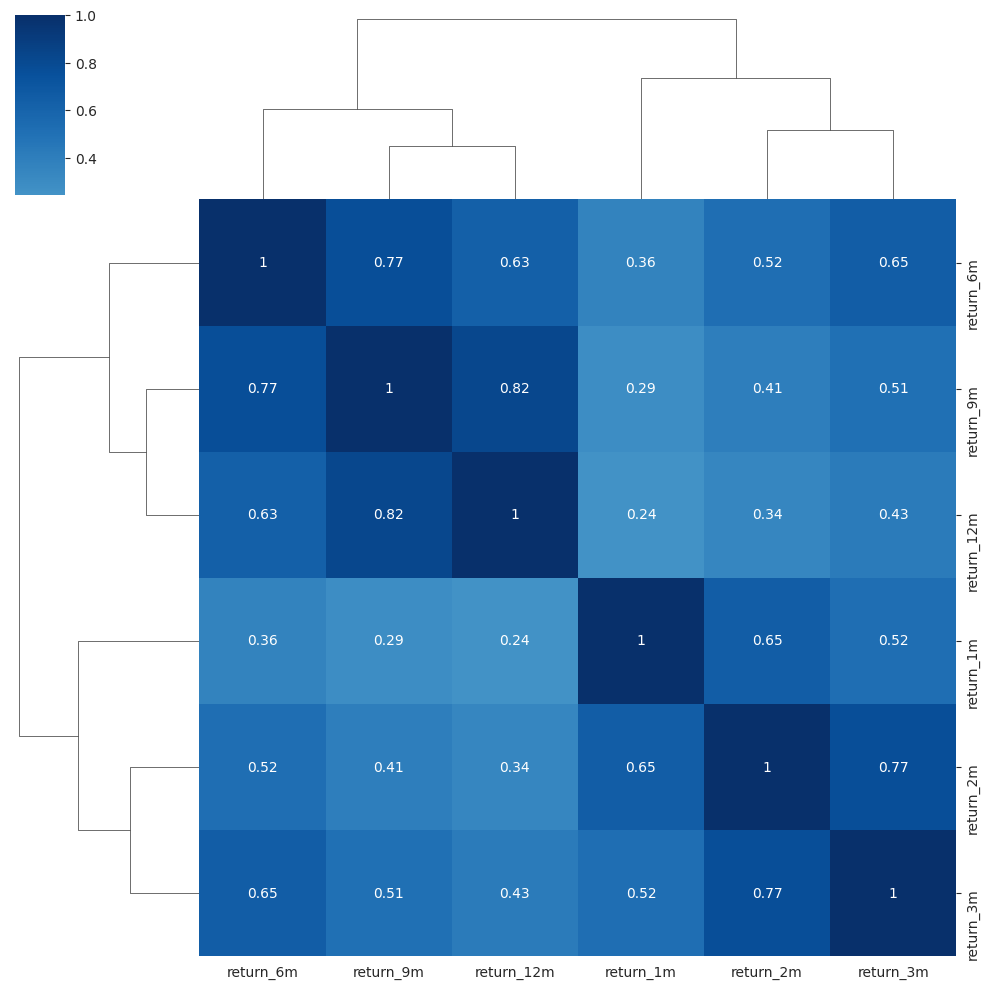

In [31]:
# cmap = sns.diverging_palette(10, 220, as_cmap=True)
sns.clustermap(data.corr('spearman'), annot=True, center=0, cmap='Blues');

We are left with 1,670 tickers.

In [32]:
data.index.get_level_values('ticker').nunique()

1838

## Rolling Factor Betas
- 팩터 벡터의 계산

[Chapter 9, Time Series Models](../09_time_series_models)에서 선형 회귀를 사용하여 자산의 일반적인 리스크 요인에 대한 노출을 추정하기 위해 Fama-French 데이터를 소개합니다.

시장 리스크, 크기, 가치, 영업이익률, 투자 등 5가지 Fama-French 요인은 경험적으로 자산 수익률을 설명하는 데 기여하며, 포트폴리오의 리스크/수익 프로필을 평가하는 데 자주 사용됩니다. 따라서 미래 수익률을 예측하는 모델에 과거 요인 노출을 금융 특성으로 포함하는 것이 자연스럽습니다.

pandas-datareader를 사용하여 과거 요인 수익률에 액세스하고, statsmodels 라이브러리의 RollingOLS 이동 회귀 기능을 사용하여 과거 노출을 다음과 같이 추정할 수 있습니다:

데이터셋의 주식에 대한 5가지 요인인 시장 리스크, 크기, 가치, 영업이익률 및 투자에 대한 요인 노출을 추정하기 위해 Fama-French 연구 요인을 사용합니다.

In [33]:
factors = ['Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA']
factor_data = web.DataReader('F-F_Research_Data_5_Factors_2x3', 'famafrench', start='2000')[0].drop('RF', axis=1)
factor_data.index = factor_data.index.to_timestamp()
factor_data = factor_data.resample('M').last().div(100)
factor_data.index.name = 'date'
factor_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 280 entries, 2000-01-31 to 2023-04-30
Freq: M
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Mkt-RF  280 non-null    float64
 1   SMB     280 non-null    float64
 2   HML     280 non-null    float64
 3   RMW     280 non-null    float64
 4   CMA     280 non-null    float64
dtypes: float64(5)
memory usage: 13.1 KB


In [34]:
factor_data = factor_data.join(data['return_1m']).sort_index()
factor_data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 360752 entries, ('A', Timestamp('2001-01-31 00:00:00', freq='M')) to ('ZUMZ', Timestamp('2018-03-31 00:00:00', freq='M'))
Data columns (total 6 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Mkt-RF     360752 non-null  float64
 1   SMB        360752 non-null  float64
 2   HML        360752 non-null  float64
 3   RMW        360752 non-null  float64
 4   CMA        360752 non-null  float64
 5   return_1m  360752 non-null  float64
dtypes: float64(6)
memory usage: 18.0+ MB


In [35]:
T = 24
betas = (factor_data.groupby(level='ticker',
                             group_keys=False)
         .apply(lambda x: RollingOLS(endog=x.return_1m,
                                     exog=sm.add_constant(x.drop('return_1m', axis=1)),
                                     window=min(T, x.shape[0]-1))
                .fit(params_only=True)
                .params
                .drop('const', axis=1)))

In [36]:
betas.describe().join(betas.sum(1).describe().to_frame('total'))

,Mkt-RF,SMB,HML,RMW,CMA,total
count,318478.000000,318478.000000,318478.000000,318478.000000,318478.000000,360752.000000
mean,0.978877,0.626574,0.123491,-0.062149,0.016887,1.486381
std,0.917586,1.254663,1.602559,1.907059,2.155855,3.305914
min,-9.825518,-10.420754,-15.215922,-23.005713,-18.423557,-33.251810
25%,0.463498,-0.119207,-0.706456,-0.973597,-1.071361,0.000000
50%,0.928597,0.541546,0.096100,0.038055,0.040629,1.214857
75%,1.444065,1.303979,0.947862,0.949469,1.135087,3.146895
max,10.858294,10.459489,15.094963,16.977443,16.657684,34.097389


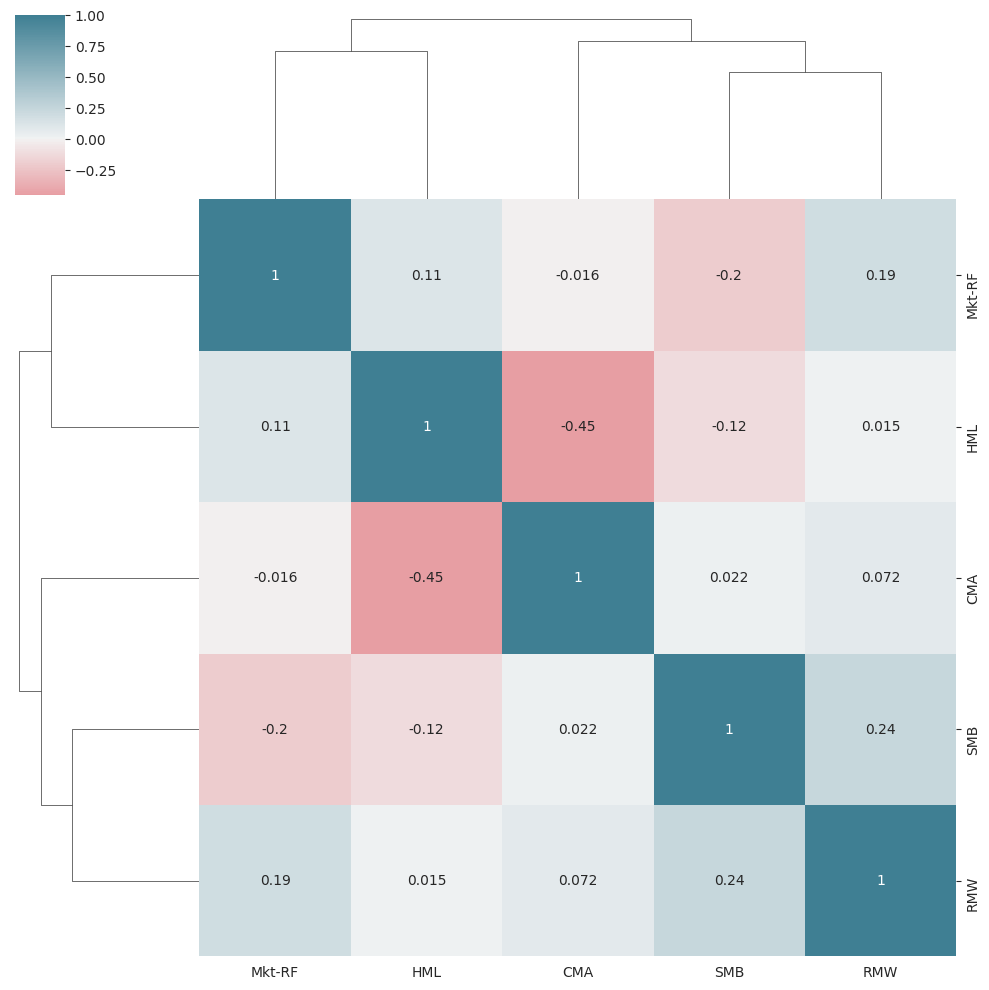

In [37]:
cmap = sns.diverging_palette(10, 220, as_cmap=True)
sns.clustermap(betas.corr(), annot=True, cmap=cmap, center=0);

In [38]:
data = (data
        .join(betas
              .groupby(level='ticker')
              .shift()))
data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 360752 entries, ('A', Timestamp('2001-01-31 00:00:00', freq='M')) to ('ZUMZ', Timestamp('2018-03-31 00:00:00', freq='M'))
Data columns (total 11 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   return_1m   360752 non-null  float64
 1   return_2m   360752 non-null  float64
 2   return_3m   360752 non-null  float64
 3   return_6m   360752 non-null  float64
 4   return_9m   360752 non-null  float64
 5   return_12m  360752 non-null  float64
 6   Mkt-RF      316640 non-null  float64
 7   SMB         316640 non-null  float64
 8   HML         316640 non-null  float64
 9   RMW         316640 non-null  float64
 10  CMA         316640 non-null  float64
dtypes: float64(11)
memory usage: 39.8+ MB


### Impute mean for missing factor betas

In [39]:
data.loc[:, factors] = data.groupby('ticker')[factors].apply(lambda x: x.fillna(x.mean()))
data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 360752 entries, ('A', Timestamp('2001-01-31 00:00:00', freq='M')) to ('ZUMZ', Timestamp('2018-03-31 00:00:00', freq='M'))
Data columns (total 11 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   return_1m   360752 non-null  float64
 1   return_2m   360752 non-null  float64
 2   return_3m   360752 non-null  float64
 3   return_6m   360752 non-null  float64
 4   return_9m   360752 non-null  float64
 5   return_12m  360752 non-null  float64
 6   Mkt-RF      360752 non-null  float64
 7   SMB         360752 non-null  float64
 8   HML         360752 non-null  float64
 9   RMW         360752 non-null  float64
 10  CMA         360752 non-null  float64
dtypes: float64(11)
memory usage: 39.8+ MB


## Momentum factors
- 모멘텀 팩터를 추가하는 법

이러한 결과를 사용하여 다음과 같이 긴 기간 동안의 수익률과 가장 최근 월간 수익률 간의 차이, 그리고 3개월과 12개월 수익률 간의 차이를 기반으로 모멘텀 요인을 계산할 수 있습니다:

In [40]:
for lag in [2,3,6,9,12]:
    data[f'momentum_{lag}'] = data[f'return_{lag}m'].sub(data.return_1m)
data[f'momentum_3_12'] = data[f'return_12m'].sub(data.return_3m)

## Date Indicators
- 시간 지표를 추가해 계절 효과를 포착하는 방법

In [41]:
dates = data.index.get_level_values('date')
data['year'] = dates.year
data['month'] = dates.month

## Lagged returns
- 래그 수익률 특성을 만드는 방법

과거 수익률을 현재 관측값과 연관된 입력 변수 또는 특성으로 사용하기 위해, 우리는 .shift() 메서드를 사용하여 히스토리컬 수익률을 현재 기간으로 이동시킵니다.

In [42]:
for t in range(1, 7):
    data[f'return_1m_t-{t}'] = data.groupby(level='ticker').return_1m.shift(t)
data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 360752 entries, ('A', Timestamp('2001-01-31 00:00:00', freq='M')) to ('ZUMZ', Timestamp('2018-03-31 00:00:00', freq='M'))
Data columns (total 25 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   return_1m      360752 non-null  float64
 1   return_2m      360752 non-null  float64
 2   return_3m      360752 non-null  float64
 3   return_6m      360752 non-null  float64
 4   return_9m      360752 non-null  float64
 5   return_12m     360752 non-null  float64
 6   Mkt-RF         360752 non-null  float64
 7   SMB            360752 non-null  float64
 8   HML            360752 non-null  float64
 9   RMW            360752 non-null  float64
 10  CMA            360752 non-null  float64
 11  momentum_2     360752 non-null  float64
 12  momentum_3     360752 non-null  float64
 13  momentum_6     360752 non-null  float64
 14  momentum_9     360752 non-null  float64
 15  momentum_12    360752 non

## Target: Holding Period Returns
- 미래 수익률을 만드는 방법

Similarly, to compute returns for various holding periods, we use the normalized period returns computed previously and shift them back to align them with the current financial features

In [43]:
for t in [1,2,3,6,12]:
    data[f'target_{t}m'] = data.groupby(level='ticker')[f'return_{t}m'].shift(-t)

In [44]:
cols = ['target_1m',
        'target_2m',
        'target_3m',
        'return_1m',
        'return_2m',
        'return_3m',
        'return_1m_t-1',
        'return_1m_t-2',
        'return_1m_t-3']

data[cols].dropna().sort_index().head(10)

target_1m  target_2m  target_3m  return_1m  return_2m  \
ticker date                                                                
A      2001-04-30  -0.140220  -0.087246  -0.098192   0.269444   0.040966   
       2001-05-31  -0.031008  -0.076414  -0.075527  -0.140220   0.044721   
       2001-06-30  -0.119692  -0.097014  -0.155847  -0.031008  -0.087246   
       2001-07-31  -0.073750  -0.173364  -0.080114  -0.119692  -0.076414   
       2001-08-31  -0.262264  -0.083279   0.009593  -0.073750  -0.097014   
       2001-09-30   0.139130   0.181052   0.134010  -0.262264  -0.173364   
       2001-10-31   0.224517   0.131458   0.108697   0.139130  -0.083279   
       2001-11-30   0.045471   0.054962   0.045340   0.224517   0.181052   
       2001-12-31   0.064539   0.045275   0.070347   0.045471   0.131458   
       2002-01-31   0.026359   0.073264  -0.003306   0.064539   0.054962   

                   return_3m  return_1m_t-1  return_1m_t-2  return_1m_t-3  
ticker date                                                                
A      2001-04-30  -0.105747      -0.146389      -0.329564      -0.003653  
       2001-05-31  -0.023317       0.269444      -0.146389      -0.329564  
       2001-06-30   0.018842      -0.140220       0.269444      -0.146389  
       2001-07-31  -0.098192      -0.031008      -0.140220       0.269444  
       2001-08-31  -0.075527      -0.119692      -0.031008      -0.140220  
       2001-09-30  -0.155847      -0.073750      -0.119692      -0.031008  
       2001-10-31  -0.080114      -0.262264      -0.073750      -0.119692  
       2001-11-30   0.009593       0.139130      -0.262264      -0.073750  
       2001-12-31   0.134010       0.224517       0.139130      -0.262264  
       2002-01-31   0.108697       0.045471       0.224517       0.139130

In [45]:
data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 360752 entries, ('A', Timestamp('2001-01-31 00:00:00', freq='M')) to ('ZUMZ', Timestamp('2018-03-31 00:00:00', freq='M'))
Data columns (total 30 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   return_1m      360752 non-null  float64
 1   return_2m      360752 non-null  float64
 2   return_3m      360752 non-null  float64
 3   return_6m      360752 non-null  float64
 4   return_9m      360752 non-null  float64
 5   return_12m     360752 non-null  float64
 6   Mkt-RF         360752 non-null  float64
 7   SMB            360752 non-null  float64
 8   HML            360752 non-null  float64
 9   RMW            360752 non-null  float64
 10  CMA            360752 non-null  float64
 11  momentum_2     360752 non-null  float64
 12  momentum_3     360752 non-null  float64
 13  momentum_6     360752 non-null  float64
 14  momentum_9     360752 non-null  float64
 15  momentum_12    360752 non

## Create age proxy

We use quintiles of IPO year as a proxy for company age.

In [46]:
data = (data
        .join(pd.qcut(stocks.ipoyear, q=5, labels=list(range(1, 6)))
              .astype(float)
              .fillna(0)
              .astype(int)
              .to_frame('age')))
data.age = data.age.fillna(-1)

## Create dynamic size proxy

We use the marketcap information from the NASDAQ ticker info to create a size proxy.

In [47]:
stocks.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2412 entries, A to ZUMZ
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   marketcap  2407 non-null   float64
 1   ipoyear    1065 non-null   float64
 2   sector     2372 non-null   object 
dtypes: float64(2), object(1)
memory usage: 139.9+ KB


Market cap information is tied to currrent prices. We create an adjustment factor to have the values reflect lower historical prices for each individual stock:

In [48]:
size_factor = (monthly_prices
               .loc[data.index.get_level_values('date').unique(),
                    data.index.get_level_values('ticker').unique()]
               .sort_index(ascending=False)
               .pct_change()
               .fillna(0)
               .add(1)
               .cumprod())
size_factor.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 207 entries, 2018-03-31 to 2001-01-31
Columns: 1838 entries, A to ZUMZ
dtypes: float64(1838)
memory usage: 2.9 MB


In [49]:
msize = (size_factor
         .mul(stocks
              .loc[size_factor.columns, 'marketcap'])).dropna(axis=1, how='all')

### Create Size indicator as deciles per period

Compute size deciles per month:

In [50]:
data['msize'] = (msize
                 .apply(lambda x: pd.qcut(x, q=10, labels=list(range(1, 11)))
                        .astype(int), axis=1)
                 .stack()
                 .swaplevel())
data.msize = data.msize.fillna(-1)

## Combine data

In [51]:
data = data.join(stocks[['sector']])
data.sector = data.sector.fillna('Unknown')

In [52]:
data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 360752 entries, ('A', Timestamp('2001-01-31 00:00:00', freq='M')) to ('ZUMZ', Timestamp('2018-03-31 00:00:00', freq='M'))
Data columns (total 33 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   return_1m      360752 non-null  float64
 1   return_2m      360752 non-null  float64
 2   return_3m      360752 non-null  float64
 3   return_6m      360752 non-null  float64
 4   return_9m      360752 non-null  float64
 5   return_12m     360752 non-null  float64
 6   Mkt-RF         360752 non-null  float64
 7   SMB            360752 non-null  float64
 8   HML            360752 non-null  float64
 9   RMW            360752 non-null  float64
 10  CMA            360752 non-null  float64
 11  momentum_2     360752 non-null  float64
 12  momentum_3     360752 non-null  float64
 13  momentum_6     360752 non-null  float64
 14  momentum_9     360752 non-null  float64
 15  momentum_12    360752 non

## Store data

We will use the data again in several later chapters, starting in [Chapter 7 on Linear Models](../07_linear_models).

In [53]:
with pd.HDFStore(DATA_STORE) as store:
    store.put('engineered_features', data.sort_index().loc[idx[:, :datetime(2018, 3, 1)], :])
    print(store.info())

<class 'pandas.io.pytables.HDFStore'>
File path: assets.h5
/engineered_features            frame        (shape->[358914,33])  
/quandl/wiki/prices             frame        (shape->[15389314,12])
/quandl/wiki/stocks             frame        (shape->[1,2])        
/sp500/fred                     frame        (shape->[2610,1])     
/sp500/stocks                   frame        (shape->[503,7])      
/sp500/stooq                    frame        (shape->[17700,5])    
/us_equities/stocks             frame        (shape->[6834,6])     


## Create Dummy variables

For most models, we need to encode categorical variables as 'dummies' (one-hot encoding):

In [54]:
dummy_data = pd.get_dummies(data,
                            columns=['year','month', 'msize', 'age',  'sector'],
                            prefix=['year','month', 'msize', 'age', ''],
                            prefix_sep=['_', '_', '_', '_', ''])
dummy_data = dummy_data.rename(columns={c:c.replace('.0', '') for c in dummy_data.columns})
dummy_data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 360752 entries, ('A', Timestamp('2001-01-31 00:00:00', freq='M')) to ('ZUMZ', Timestamp('2018-03-31 00:00:00', freq='M'))
Data columns (total 88 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   return_1m              360752 non-null  float64
 1   return_2m              360752 non-null  float64
 2   return_3m              360752 non-null  float64
 3   return_6m              360752 non-null  float64
 4   return_9m              360752 non-null  float64
 5   return_12m             360752 non-null  float64
 6   Mkt-RF                 360752 non-null  float64
 7   SMB                    360752 non-null  float64
 8   HML                    360752 non-null  float64
 9   RMW                    360752 non-null  float64
 10  CMA                    360752 non-null  float64
 11  momentum_2             360752 non-null  float64
 12  momentum_3             360752 non-null  float64


#### TA-Lib를 사용해 기술적 알파 팩터를 만드는 방법

#### 02_how_to_use_talib.ipynb

# How to use TA-Lib to generate Alpha Factors
- TA-Lib를 사용해 기술적 알파 팩터를 만드는 방법

## Imports & Settings

In [55]:
import warnings
warnings.filterwarnings('ignore')

In [63]:
# colab에서 talib 설치
!wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
!tar -xzvf ta-lib-0.4.0-src.tar.gz
%cd ta-lib
!./configure --prefix=/usr
!make
!make install
!pip install Ta-Lib
import talib

--2023-06-18 09:19:38--  http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
Resolving prdownloads.sourceforge.net (prdownloads.sourceforge.net)... 204.68.111.105
Connecting to prdownloads.sourceforge.net (prdownloads.sourceforge.net)|204.68.111.105|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz [following]
--2023-06-18 09:19:38--  http://downloads.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz
Resolving downloads.sourceforge.net (downloads.sourceforge.net)... 204.68.111.105
Reusing existing connection to prdownloads.sourceforge.net:80.
HTTP request sent, awaiting response... 302 Found
Location: http://netactuate.dl.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz [following]
--2023-06-18 09:19:38--  http://netactuate.dl.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz
Resolving netactuat

In [64]:
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from talib import RSI, BBANDS, MACD

In [65]:
sns.set_style('whitegrid')
idx = pd.IndexSlice

## Get Data

The `assets.h5` store can be generated using the the notebook [create_datasets](../../data/create_datasets.ipynb) in the [data](../../data) directory in the root directory of this repo for instruction to download the following dataset.

Set data store location:

In [66]:
DATA_STORE = 'assets.h5'

We load the AAPL stock price for the 2007-10 using `pd.IndexSlice` to perform a slice operation on the `pd.MultiIndex`, select the adjusted close price and unpivot the column to convert the DataFrame to wide format with tickers in the columns and timestamps in the rows:

In [69]:
!unzip /content/drive/MyDrive/스터디/금융공학_퀀트_스터디/data/WIKI_PRICES.zip
!mv WIKI_PRICES_212b326a081eacca455e13140d7bb9db.csv wiki_prices.csv

Archive:  /content/drive/MyDrive/스터디/금융공학_퀀트_스터디/data/WIKI_PRICES.zip
  inflating: WIKI_PRICES_212b326a081eacca455e13140d7bb9db.csv  


In [70]:
df = (pd.read_csv('wiki_prices.csv',
                 parse_dates=['date'],
                 index_col=['date', 'ticker'],
                 infer_datetime_format=True)
     .sort_index())

print(df.info(null_counts=True))
with pd.HDFStore(DATA_STORE) as store:
    store.put('quandl/wiki/prices', df)

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 15389314 entries, (Timestamp('1962-01-02 00:00:00'), 'ARNC') to (Timestamp('2018-03-27 00:00:00'), 'ZUMZ')
Data columns (total 12 columns):
 #   Column       Non-Null Count     Dtype  
---  ------       --------------     -----  
 0   open         15388776 non-null  float64
 1   high         15389259 non-null  float64
 2   low          15389259 non-null  float64
 3   close        15389313 non-null  float64
 4   volume       15389314 non-null  float64
 5   ex-dividend  15389314 non-null  float64
 6   split_ratio  15389313 non-null  float64
 7   adj_open     15388776 non-null  float64
 8   adj_high     15389259 non-null  float64
 9   adj_low      15389259 non-null  float64
 10  adj_close    15389313 non-null  float64
 11  adj_volume   15389314 non-null  float64
dtypes: float64(12)
memory usage: 1.4+ GB
None


In [71]:
with pd.HDFStore(DATA_STORE) as store:
    data = (store['quandl/wiki/prices']
            .loc[idx['2007':'2010', 'AAPL'],
                 ['adj_open', 'adj_high', 'adj_low', 'adj_close', 'adj_volume']]
            .unstack('ticker')
            .swaplevel(axis=1)
            .loc[:, 'AAPL']
            .rename(columns=lambda x: x.replace('adj_', '')))

In [72]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1008 entries, 2007-01-03 to 2010-12-31
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   open    1008 non-null   float64
 1   high    1008 non-null   float64
 2   low     1008 non-null   float64
 3   close   1008 non-null   float64
 4   volume  1008 non-null   float64
dtypes: float64(5)
memory usage: 47.2 KB


## Compute Bollinger Bands

In [73]:
up, mid, low = BBANDS(data.close, timeperiod=21, nbdevup=2, nbdevdn=2, matype=0)

## Compute Relative Strength Index

In [74]:
rsi = RSI(data.close, timeperiod=14)

## Moving Average Convergence/Divergence

MACD는 두 지수 이동 평균(EMA)인 장기 및 단기 기간 사이의 차이를 계산합니다.

ta-lib의 MACD 지표 구현은 네 가지 입력값을 갖습니다:
- 종가(close price)
- `fastperiod`: 단기 EMA 기간
- `slowperiod`: 장기 EMA 기간
- `signalperiod`: MACD 자체의 EMA 기간

세 가지 출력값을 갖습니다:
- `macd`: 빠른 EMA와 느린 EMA 사이의 차이입니다.
- `macdsignal`: `signalperiod` 기간으로 MACD 값의 EMA입니다.
- `macdhist`: `macd`와 `macdsignal` 사이의 차이를 계산합니다.

In [75]:
macd, macdsignal, macdhist = MACD(data.close, fastperiod=12, slowperiod=26, signalperiod=9)

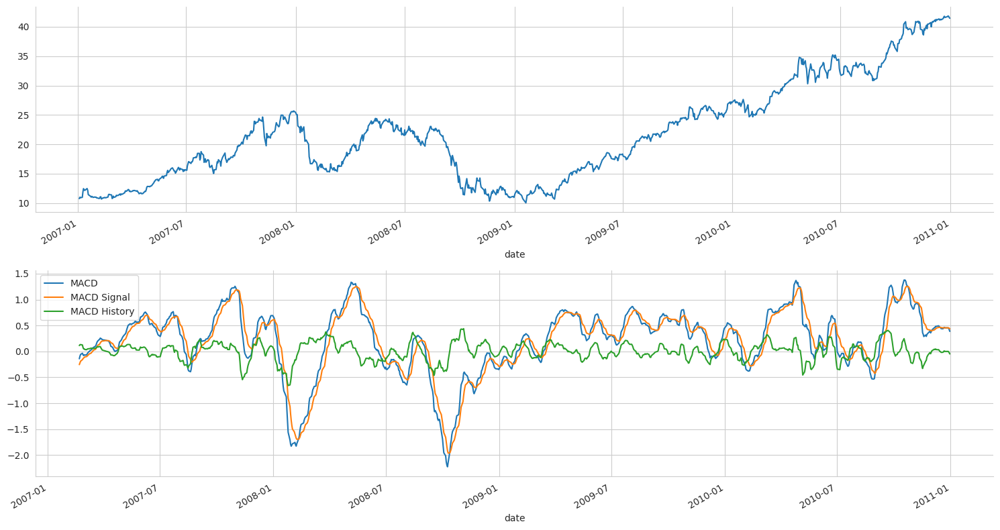

In [76]:
macd_data = pd.DataFrame({'AAPL': data.close, 'MACD': macd, 'MACD Signal': macdsignal, 'MACD History': macdhist})

fig, axes= plt.subplots(nrows=2, figsize=(15, 8))
macd_data.AAPL.plot(ax=axes[0])
macd_data.drop('AAPL', axis=1).plot(ax=axes[1])
fig.tight_layout()
sns.despine();

## Plot Result

In [77]:
data = pd.DataFrame({'AAPL': data.close, 'BB Up': up, 'BB Mid': mid, 'BB down': low, 'RSI': rsi, 'MACD': macd})

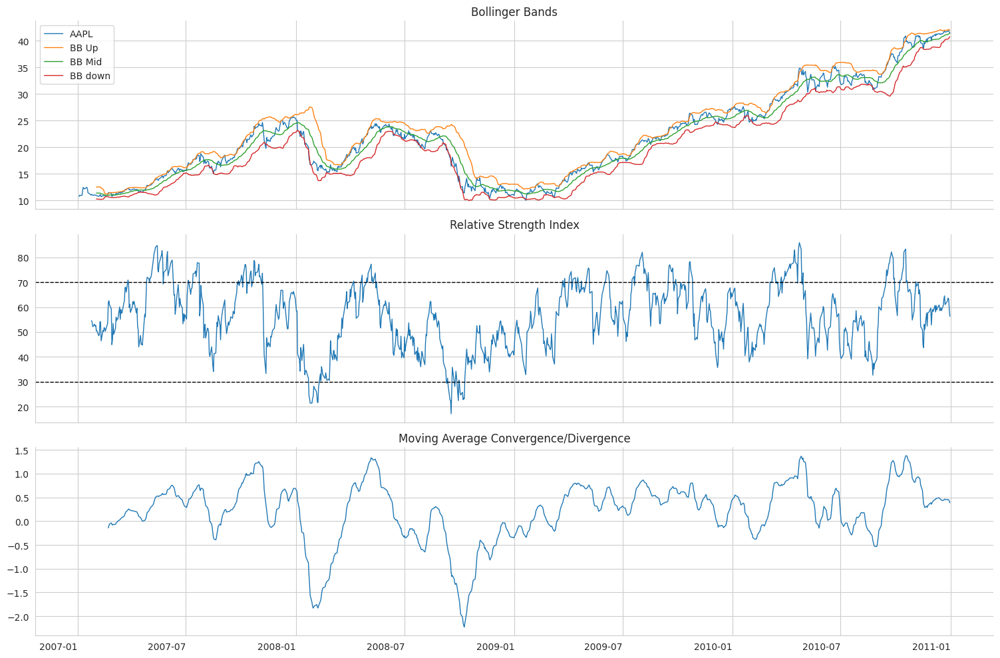

In [78]:
fig, axes= plt.subplots(nrows=3, figsize=(15, 10), sharex=True)
data.drop(['RSI', 'MACD'], axis=1).plot(ax=axes[0], lw=1, title='Bollinger Bands')
data['RSI'].plot(ax=axes[1], lw=1, title='Relative Strength Index')
axes[1].axhline(70, lw=1, ls='--', c='k')
axes[1].axhline(30, lw=1, ls='--', c='k')
data.MACD.plot(ax=axes[2], lw=1, title='Moving Average Convergence/Divergence', rot=0)
axes[2].set_xlabel('')
fig.tight_layout()
sns.despine();

#### 칼만 필터를 사용한 알파 팩터의 잡음 제거
##### 칼만 필터의 작동 원리
- 칼만 필터: 시계열과 같은 순차적 데이터에 대한 동적 선형 모델로 새로운 정보가 도달하면 이에 대해 적응하는 모델
    - 확률 모델을 기반으로 새로운 데이터를 시계열의 현재 값 추정에 반영한다.
    - 시간 경과에 따른 측정치 z가 주어졌을 때 상태 변수 x의 사후 분포를 ㅈㄴ파하는 베이지안 접근법을 취한다.

- 실제 시간에서 수집할 수 있는 관측치 시퀀스에서 은닉 상태를 복원할 때 알고리듬은 다음 두 스텝을 반복한다.
    1. 예측 스텝: 프로세스의 현재 상태를 추정한다.
    2. 측정 스텝: 잡음이 섞인 관측을 사용해 양 스텝에서 정보를 더 확실한 추정치에 더 높은 가중치를 주는 식으로 평균해 추정치를 업데이트한다.

#### 03_kalman_filter_and_wavelets.ipynb

# How to use the Kalman Filter and Wavelets
- pykalman을 이용한 칼만 필터의 적용법

## Imports & Settings

In [79]:
import warnings
warnings.filterwarnings('ignore')

In [82]:
!pip install pykalman

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.9/228.9 kB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pykalman: filename=pykalman-0.9.5-py3-none-any.whl size=48442 sha256=72914e2aca7e9407bfb897637cbf31c6468f479a7d7bf45dbdfb9ea271129e69
  Stored in directory: /root/.cache/pip/wheels/76/33/ef/5f332226e13a5089c6dd4b01cc2bcb59491d18f955fa2d3807
Successfully built pykalman


In [83]:
%matplotlib inline

from datetime import datetime
import itertools

import pandas as pd
import pandas_datareader.data as web
from pykalman import KalmanFilter
import pywt

import matplotlib.pyplot as plt
import seaborn as sns

In [84]:
warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
idx = pd.IndexSlice

## Get Data

The `assets.h5` store can be generated using the the notebook [create_datasets](../../data/create_datasets.ipynb) in the [data](../../data) directory in the root directory of this repo for instruction to download the following dataset.

We load the Quandl stock price datasets covering the US equity markets 2000-18 using `pd.IndexSlice` to perform a slice operation on the `pd.MultiIndex`, select the adjusted close price and unpivot the column to convert the DataFrame to wide format with tickers in the columns and timestamps in the rows:

Set data store location:

In [86]:
DATA_STORE = 'assets.h5'

In [88]:
df = web.DataReader(name='SP500', data_source='fred', start=2009).squeeze().to_frame('close')
print(df.info())
with pd.HDFStore(DATA_STORE) as store:
    store.put('sp500/fred', df)

sp500_stooq = (pd.read_csv('/content/drive/MyDrive/스터디/금융공학_퀀트_스터디/data/^spx_d.csv', index_col=0,
                     parse_dates=True).loc['1950':'2019'].rename(columns=str.lower))
print(sp500_stooq.info())

with pd.HDFStore(DATA_STORE) as store:
    store.put('sp500/stooq', sp500_stooq)

url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
df = pd.read_html(url, header=0)[0]

df.columns = ['ticker', 'name', 'gics_sector', 'gics_sub_industry',
              'location', 'first_added', 'cik', 'founded']
df = df.set_index('ticker')
# sec_filings이 사라짐

with pd.HDFStore(DATA_STORE) as store:
    store.put('sp500/stocks', df)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2610 entries, 2013-06-17 to 2023-06-16
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   close   2519 non-null   float64
dtypes: float64(1)
memory usage: 40.8 KB
None
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17700 entries, 1950-01-03 to 2019-12-31
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   open    17700 non-null  float64
 1   high    17700 non-null  float64
 2   low     17700 non-null  float64
 3   close   17700 non-null  float64
 4   volume  17700 non-null  float64
dtypes: float64(5)
memory usage: 829.7 KB
None


In [89]:
with pd.HDFStore(DATA_STORE) as store:
    sp500 = store['sp500/stooq'].loc['2009': '2010', 'close']

## Kalman Filter

### Configuration

In [90]:
kf = KalmanFilter(transition_matrices = [1],
                  observation_matrices = [1],
                  initial_state_mean = 0,
                  initial_state_covariance = 1,
                  observation_covariance=1,
                  transition_covariance=.01)

### Estimate the hidden state

In [91]:
state_means, _ = kf.filter(sp500)

### Compare with moving average

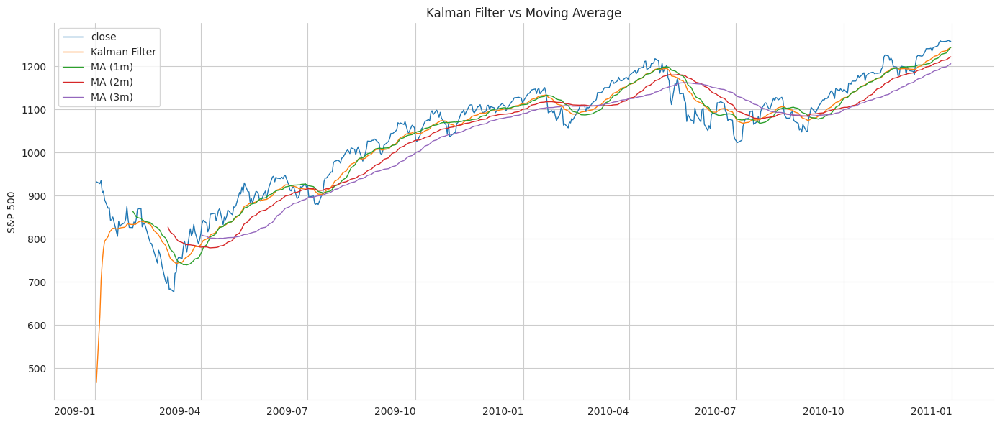

In [92]:
sp500_smoothed = sp500.to_frame('close')
sp500_smoothed['Kalman Filter'] = state_means
for months in [1,2,3]:
    sp500_smoothed[f'MA ({months}m)'] = sp500.rolling(window=months*21).mean()

ax = sp500_smoothed.plot(title='Kalman Filter vs Moving Average', figsize=(14,6), lw=1, rot=0)
ax.set_xlabel('')
ax.set_ylabel('S&P 500')
plt.tight_layout()
sns.despine();

## Wavelets
- 웨이블릿을 이용한 잡음 데이터의 전처리 방법

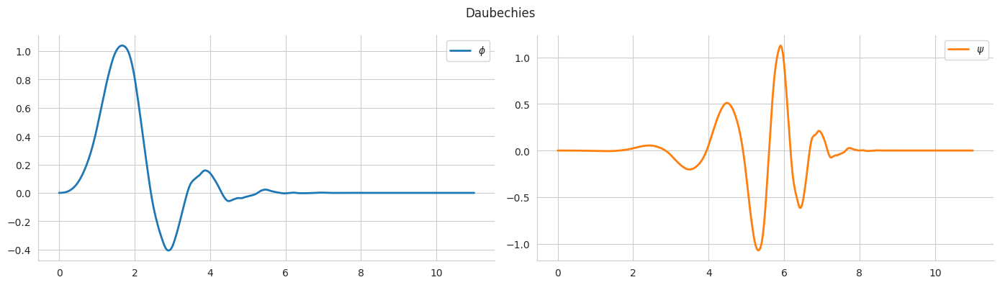

In [93]:
wavelet = pywt.Wavelet('db6')
phi, psi, x = wavelet.wavefun(level=5)
df = pd.DataFrame({'$\phi$': phi, '$\psi$': psi}, index=x)
df.plot(title='Daubechies', subplots=True, layout=(1, 2), figsize=(14, 4), lw=2, rot=0)
plt.tight_layout()
sns.despine();

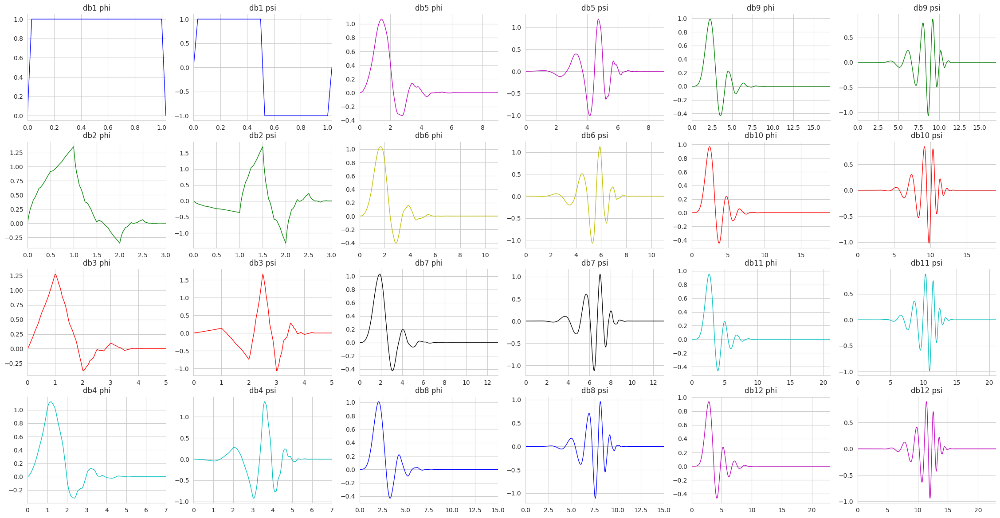

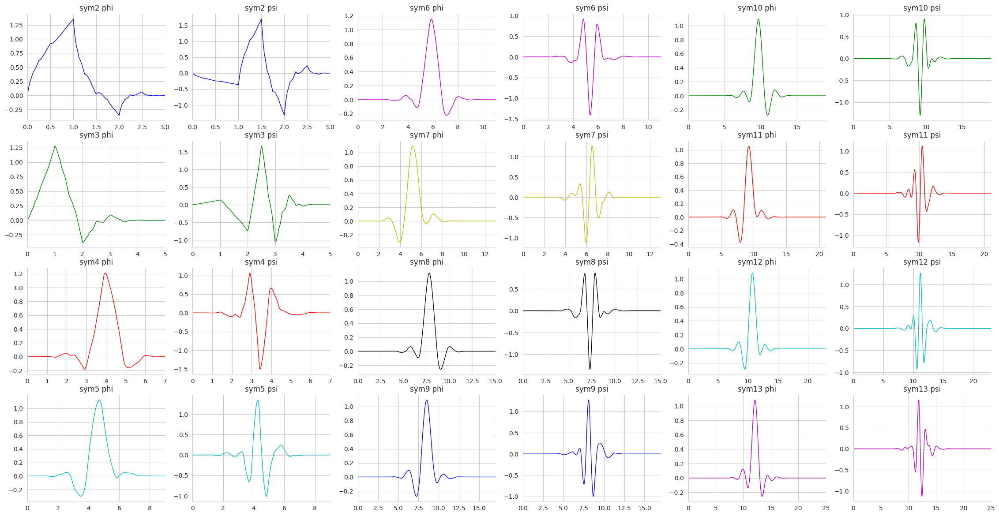

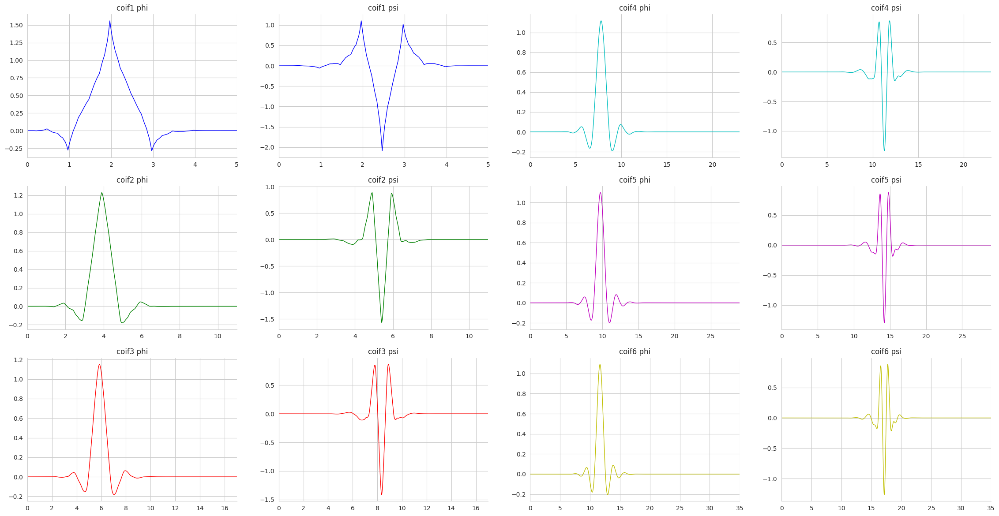

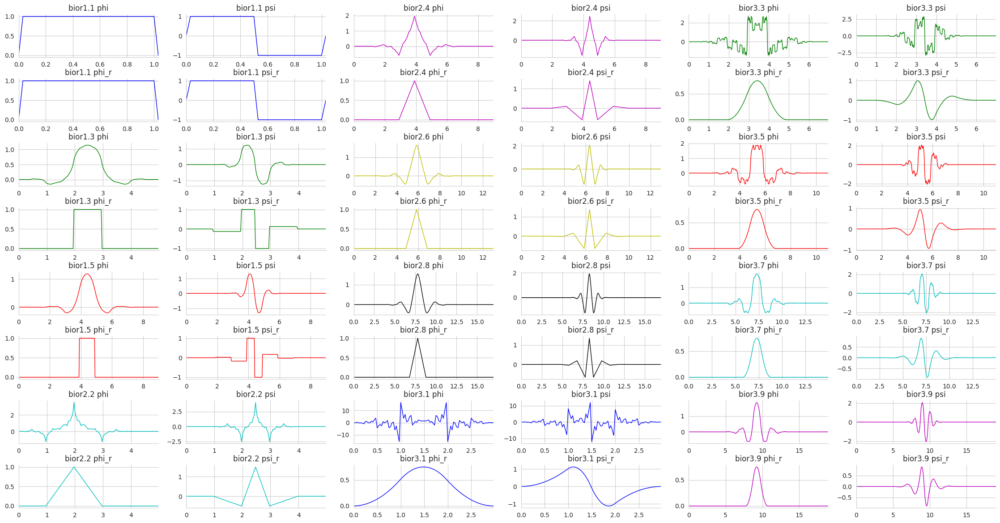

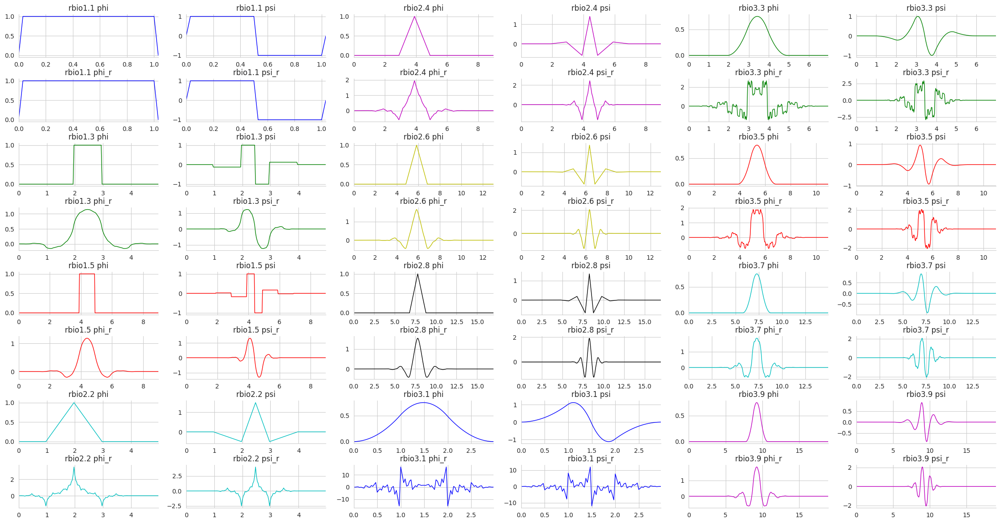

In [94]:
plot_data = [('db', (4, 3)),
             ('sym', (4, 3)),
             ('coif', (3, 2))]


for family, (rows, cols) in plot_data:
    fig = plt.figure(figsize=(24, 12))
    fig.subplots_adjust(hspace=0.2, wspace=0.2, bottom=.02, left=.06,
                        right=.97, top=.94)
    colors = itertools.cycle('bgrcmyk')

    wnames = pywt.wavelist(family)
    i = iter(wnames)
    for col in range(cols):
        for row in range(rows):
            try:
                wavelet = pywt.Wavelet(next(i))
            except StopIteration:
                break
            phi, psi, x = wavelet.wavefun(level=5)

            color = next(colors)
            ax = fig.add_subplot(rows, 2 * cols, 1 + 2 * (col + row * cols))
            ax.set_title(wavelet.name + " phi")
            ax.plot(x, phi, color, lw=1)
            ax.set_xlim(min(x), max(x))

            ax = fig.add_subplot(rows, 2*cols, 1 + 2*(col + row*cols) + 1)
            ax.set_title(wavelet.name + " psi")
            ax.plot(x, psi, color, lw=1)
            ax.set_xlim(min(x), max(x))
    sns.despine()

for family, (rows, cols) in [('bior', (4, 3)), ('rbio', (4, 3))]:
    fig = plt.figure(figsize=(24, 12))
    fig.subplots_adjust(hspace=0.5, wspace=0.2, bottom=.02, left=.06,
                        right=.97, top=.94)

    colors = itertools.cycle('bgrcmyk')
    wnames = pywt.wavelist(family)
    i = iter(wnames)
    for col in range(cols):
        for row in range(rows):
            try:
                wavelet = pywt.Wavelet(next(i))
            except StopIteration:
                break
            phi, psi, phi_r, psi_r, x = wavelet.wavefun(level=5)
            row *= 2

            color = next(colors)
            ax = fig.add_subplot(2*rows, 2*cols, 1 + 2*(col + row*cols))
            ax.set_title(wavelet.name + " phi")
            ax.plot(x, phi, color, lw=1)
            ax.set_xlim(min(x), max(x))

            ax = fig.add_subplot(2*rows, 2*cols, 2*(1 + col + row*cols))
            ax.set_title(wavelet.name + " psi")
            ax.plot(x, psi, color, lw=1)
            ax.set_xlim(min(x), max(x))

            row += 1
            ax = fig.add_subplot(2*rows, 2*cols, 1 + 2*(col + row*cols))
            ax.set_title(wavelet.name + " phi_r")
            ax.plot(x, phi_r, color, lw=1)
            ax.set_xlim(min(x), max(x))

            ax = fig.add_subplot(2*rows, 2*cols, 1 + 2*(col + row*cols) + 1)
            ax.set_title(wavelet.name + " psi_r")
            ax.plot(x, psi_r, color, lw=1)
            ax.set_xlim(min(x), max(x))
    sns.despine()

plt.show()

### Available Wavelet Families

In [95]:
pywt.families(short=False)

['Haar',
 'Daubechies',
 'Symlets',
 'Coiflets',
 'Biorthogonal',
 'Reverse biorthogonal',
 'Discrete Meyer (FIR Approximation)',
 'Gaussian',
 'Mexican hat wavelet',
 'Morlet wavelet',
 'Complex Gaussian wavelets',
 'Shannon wavelets',
 'Frequency B-Spline wavelets',
 'Complex Morlet wavelets']

### Smoothing the S&P 500

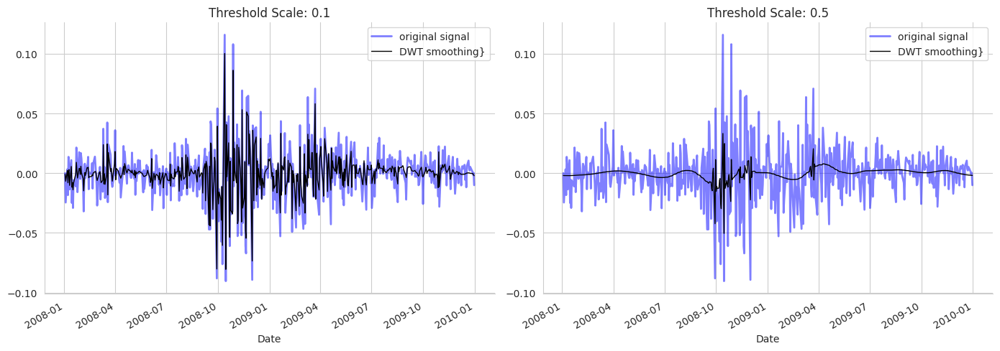

In [96]:
signal = (pd.read_hdf(DATA_STORE, 'sp500/stooq')
          .loc['2008': '2009']
          .close.pct_change()
          .dropna())

fig, axes = plt.subplots(ncols=2, figsize=(14, 5))

wavelet = "db6"
for i, scale in enumerate([.1, .5]):

    coefficients = pywt.wavedec(signal, wavelet, mode='per')
    coefficients[1:] = [pywt.threshold(i, value=scale*signal.max(), mode='soft') for i in coefficients[1:]]
    reconstructed_signal = pywt.waverec(coefficients, wavelet, mode='per')
    signal.plot(color="b", alpha=0.5, label='original signal', lw=2,
                 title=f'Threshold Scale: {scale:.1f}', ax=axes[i])
    pd.Series(reconstructed_signal, index=signal.index).plot(c='k', label='DWT smoothing}', linewidth=1, ax=axes[i])
    axes[i].legend()
fig.tight_layout()
sns.despine();

## 신호에서 트레이딩으로: 백테스트를 위한 집라인

### 단일 팩터 전략을 백테스트 하는 방법

### 04_single_factor_zipline.ipynb

# Zipline Backtest with Single Factor
- 시장 데이터에서 산출한 단일 알파 팩터
- Zipline에서 사용하는 Panas 0.20.0 버전이 더이상 지원되지 않아서 확인 불가능

This notebook develops and test a simple mean-reversion factor that measures how much recent performance has deviated from the historical average. Short-term reversal is a common strategy that takes advantage of the weakly predictive pattern that stock price increases are likely to mean-revert back down over horizons from less than a minute to one month.

## Imports & Settings

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
sns.set_style('whitegrid')

먼저, 오프라인 환경에서 zipline alpha factor 연구 워크플로우를 설명하겠습니다. 특히, 최근 성과가 과거 평균과 얼마나 벗어났는지를 측정하는 간단한 평균회귀(factor)를 개발하고 테스트할 것입니다.

단기 회귀는 주식 가격이 일분부터 한 달까지의 기간 동안 하락하는 경향을 가지고 있다는 약한 예측력 패턴을 활용하는 일반적인 전략입니다.

이를 위해 해당 factor는 지난 한 해 동안의 이동 월간 수익률에 대한 z-score를 마지막 월간 수익률과 비교합니다. 이 시점에서 주문을 넣지 않고, 단지 CustomFactor의 구현과 시뮬레이션 중에 결과를 기록하는 방법을 설명하기 위한 것입니다.

기본적인 설정 이후, `MeanReversion`은 `CustomFactor`를 상속하고 `compute()` 메서드를 정의합니다. 기본 입력값으로는 기본적으로 1년 기간의 월간 수익률로 설정되어 있으므로, monthly_return 변수는 주어진 날짜의 Quandl 데이터셋의 각 보안에 대해 252개의 행과 1개의 열을 갖게 됩니다.

`compute_factors()` 메서드는 `MeanReversion` 팩터 인스턴스를 생성하고, long, short, 그리고 ranking 파이프라인 컬럼을 생성합니다. 이전 두 컬럼은 주문을 넣는 데 사용될 수 있는 불리언 값이며, 후자는 전체적인 순위를 반영하여 전체적인 팩터 성능을 평가합니다. 또한, 보다 유동성이 높은 주식에 대해서만 계산을 제한하기 위해 내장된 `AverageDollarVolume` 팩터를 사용합니다.

결과를 통해 long과 short 주문을 넣을 수 있습니다. 다음 장에서는 리밸런싱 기간을 선택하고 새로운 신호가 도착할 때 포트폴리오 보유량을 조정하여 포트폴리오를 구축하는 방법에 대해 알아보겠습니다.

- `initialize()` 메서드는 compute_factors() 파이프라인을 등록하며, before_trading_start() 메서드는 파이프라인이 매일 실행되도록 보장합니다.
- `record()` 함수는 파이프라인의 순위 컬럼과 현재 자산 가격을 `run_algorithm()` 함수에 의해 반환된 성과 DataFrame에 추가합니다.

Run using jupyter notebook extension

In [4]:
!apt-get install libatlas-base-dev python-dev gfortran pkg-config libfreetype6-dev hdf5-tools

Reading package lists... Done
Building dependency tree       
Reading state information... Done
Note, selecting 'python-dev-is-python2' instead of 'python-dev'
gfortran is already the newest version (4:9.3.0-1ubuntu2).
pkg-config is already the newest version (0.29.1-0ubuntu4).
hdf5-tools is already the newest version (1.10.4+repack-11ubuntu1).
libatlas-base-dev is already the newest version (3.10.3-8ubuntu7).
python-dev-is-python2 is already the newest version (2.7.17-4).
libfreetype6-dev is already the newest version (2.10.1-2ubuntu0.3).
0 upgraded, 0 newly installed, 0 to remove and 15 not upgraded.


In [32]:
!pip install pandas==0.22.0 --no-cache-dir

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 36.6 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × pip subprocess to install build dependencies did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Installing build dependencies ... error
error: subprocess-exited-with-error

× pip subprocess to install build dependencies did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [9]:
!pip install zipline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached zipline-1.4.1.tar.gz (5.4 MB)
  Preparing metadata (setup.py) ... done
  Using cached Logbook-1.5.3.tar.gz (85 kB)
  Preparing metadata (setup.py) ... done
  Using cached python-interface-1.6.1.tar.gz (19 kB)
  Preparing metadata (setup.py) ... done
  Using cached pandas-0.22.0.tar.gz (11.3 MB)
  error: subprocess-exited-with-error
  
  × pip subprocess to install build dependencies did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Installing build dependencies ... error
error: subprocess-exited-with-error

× pip subprocess to install build dependencies did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [ ]:
import os
os.environ['QUANDL_API_KEY'] = 'Your Key'

In [ ]:
%load_ext zipline

Using the `quandl` bundle instead of the default `quantopian-quandl` because the latter has a bug that requires (manually) fixing the SQL database. If you have a file with benchmark returns you can provide this instead of `--no-benchmark` (see [docs](https://github.com/stefan-jansen/zipline/blob/master/docs/source/whatsnew/1.4.0.txt)).

In [ ]:
%%zipline --start 2015-1-1 --end 2018-1-1 --output single_factor.pickle --no-benchmark --bundle quandl

from zipline.api import (
    attach_pipeline,
    date_rules,
    time_rules,
    order_target_percent,
    pipeline_output,
    record,
    schedule_function,
    get_open_orders,
    calendars
)
from zipline.finance import commission, slippage
from zipline.pipeline import Pipeline, CustomFactor
from zipline.pipeline.factors import Returns, AverageDollarVolume
import numpy as np
import pandas as pd

MONTH = 21
YEAR = 12 * MONTH
N_LONGS = N_SHORTS = 25
VOL_SCREEN = 1000


class MeanReversion(CustomFactor):
    """Compute ratio of latest monthly return to 12m average,
       normalized by std dev of monthly returns"""
    inputs = [Returns(window_length=MONTH)]
    window_length = YEAR

    def compute(self, today, assets, out, monthly_returns):
        df = pd.DataFrame(monthly_returns)
        out[:] = df.iloc[-1].sub(df.mean()).div(df.std())


def compute_factors():
    """Create factor pipeline incl. mean reversion,
        filtered by 30d Dollar Volume; capture factor ranks"""
    mean_reversion = MeanReversion()
    dollar_volume = AverageDollarVolume(window_length=30)
    return Pipeline(columns={'longs': mean_reversion.bottom(N_LONGS),
                             'shorts': mean_reversion.top(N_SHORTS),
                             'ranking': mean_reversion.rank(ascending=False)},
                    screen=dollar_volume.top(VOL_SCREEN))


def exec_trades(data, assets, target_percent):
    """Place orders for assets using target portfolio percentage"""
    for asset in assets:
        if data.can_trade(asset) and not get_open_orders(asset):
            order_target_percent(asset, target_percent)


def rebalance(context, data):
    """Compute long, short and obsolete holdings; place trade orders"""
    factor_data = context.factor_data
    record(factor_data=factor_data.ranking)

    assets = factor_data.index
    record(prices=data.current(assets, 'price'))

    longs = assets[factor_data.longs]
    shorts = assets[factor_data.shorts]
    divest = set(context.portfolio.positions.keys()) - set(longs.union(shorts))

    exec_trades(data, assets=divest, target_percent=0)
    exec_trades(data, assets=longs, target_percent=1 / N_LONGS)
    exec_trades(data, assets=shorts, target_percent=-1 / N_SHORTS)


def initialize(context):
    """Setup: register pipeline, schedule rebalancing,
        and set trading params"""
    attach_pipeline(compute_factors(), 'factor_pipeline')
    schedule_function(rebalance,
                      date_rules.week_start(),
                      time_rules.market_open(),
                      calendar=calendars.US_EQUITIES)
    context.set_commission(commission.PerShare(cost=.01, min_trade_cost=0))
    context.set_slippage(slippage.VolumeShareSlippage())


def before_trading_start(context, data):
    """Run factor pipeline"""
    context.factor_data = pipeline_output('factor_pipeline')

,period_open,period_close,shorts_count,long_value,short_value,long_exposure,pnl,capital_used,short_exposure,orders,...,sortino,max_drawdown,max_leverage,excess_return,treasury_period_return,trading_days,period_label,algorithm_period_return,factor_data,prices
2015-01-02 21:00:00+00:00,2015-01-02 14:31:00+00:00,2015-01-02 21:00:00+00:00,0,0.000,0.000,0.000,0.000000,0.000000e+00,0.000,[],...,NaN,0.000000,0.000000,0.0,0.0,1,2015-01,0.000000,NaN,NaN
2015-01-05 21:00:00+00:00,2015-01-05 14:31:00+00:00,2015-01-05 21:00:00+00:00,0,0.000,0.000,0.000,0.000000,0.000000e+00,0.000,"[{'id': '4ef8337dc8614f9183a8e8a7a0df3c18', 'd...",...,NaN,0.000000,0.000000,0.0,0.0,2,2015-01,0.000000,Equity(0 [A]) 2707.0 Equity(2 [AAL]) ...,Equity(0 [A]) 39.800 Equity(2 [AAL])...
2015-01-06 21:00:00+00:00,2015-01-06 14:31:00+00:00,2015-01-06 21:00:00+00:00,4,4731525.565,-1617262.705,4731525.565,-3799.475085,-3.118062e+06,-1617262.705,"[{'id': '4ef8337dc8614f9183a8e8a7a0df3c18', 'd...",...,-9.165151,-0.000380,0.635120,0.0,0.0,3,2015-01,-0.000380,Equity(0 [A]) 2707.0 Equity(2 [AAL]) ...,Equity(0 [A]) 39.800 Equity(2 [AAL])...
2015-01-07 21:00:00+00:00,2015-01-07 14:31:00+00:00,2015-01-07 21:00:00+00:00,4,4757100.850,-1629987.410,4757100.850,12850.580000,0.000000e+00,-1629987.410,[],...,18.918320,-0.000380,0.638131,0.0,0.0,4,2015-01,0.000905,Equity(0 [A]) 2707.0 Equity(2 [AAL]) ...,Equity(0 [A]) 39.800 Equity(2 [AAL])...
2015-01-08 21:00:00+00:00,2015-01-08 14:31:00+00:00,2015-01-08 21:00:00+00:00,4,4835941.280,-1645106.080,4835941.280,63721.760000,0.000000e+00,-1645106.080,[],...,135.877107,-0.000380,0.643422,0.0,0.0,5,2015-01,0.007277,Equity(0 [A]) 2707.0 Equity(2 [AAL]) ...,Equity(0 [A]) 39.800 Equity(2 [AAL])...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-22 21:00:00+00:00,2017-12-22 14:31:00+00:00,2017-12-22 21:00:00+00:00,10,5266915.040,-4598653.320,5266915.040,-16960.030000,0.000000e+00,-4598653.320,[],...,0.609931,-0.142578,1.259576,0.0,0.0,751,2017-12,0.102076,Equity(0 [A]) 2393.0 Equity(1 [AA]) ...,Equity(0 [A]) 67.66 Equity(1 [AA]) ...
2017-12-26 21:00:00+00:00,2017-12-26 14:31:00+00:00,2017-12-26 21:00:00+00:00,10,5217746.950,-4592983.200,5217746.950,-43497.970000,0.000000e+00,-4592983.200,"[{'id': 'fb0fdf179c8641beaeec4f1bff3d1ca4', 'd...",...,0.587086,-0.142578,1.259576,0.0,0.0,752,2017-12,0.097727,Equity(0 [A]) 2363.0 Equity(1 [AA]) ...,Equity(0 [A]) 67.25 Equity(1 [AA]) ...
2017-12-27 21:00:00+00:00,2017-12-27 14:31:00+00:00,2017-12-27 21:00:00+00:00,13,3966687.510,-5240774.395,3966687.510,41248.841483,1.940099e+06,-5240774.395,"[{'id': 'fb0fdf179c8641beaeec4f1bff3d1ca4', 'd...",...,0.607626,-0.142578,1.259576,0.0,0.0,753,2017-12,0.101852,Equity(0 [A]) 2363.0 Equity(1 [AA]) ...,Equity(0 [A]) 67.25 Equity(1 [AA]) ...
2017-12-28 21:00:00+00:00,2017-12-28 14:31:00+00:00,2017-12-28 21:00:00+00:00,12,3967663.630,-5158764.315,3967663.630,25543.807669,-5.744239e+04,-5158764.315,"[{'id': '5e21283eb12b47749c70fb46d0525f10', 'd...",...,0.620128,-0.142578,1.259576,0.0,0.0,754,2017-12,0.104406,Equity(0 [A]) 2363.0 Equity(1 [AA]) ...,Equity(0 [A]) 67.25 Equity(1 [AA]) ...


## Inspect Results

We can get the result `DataFrame` using `_` which captures the last cell output (only works when you run it right after the above cell)

In [ ]:
result = _

In [ ]:
result.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 755 entries, 2015-01-02 21:00:00+00:00 to 2017-12-29 21:00:00+00:00
Data columns (total 39 columns):
 #   Column                   Non-Null Count  Dtype              
---  ------                   --------------  -----              
 0   period_open              755 non-null    datetime64[ns, UTC]
 1   period_close             755 non-null    datetime64[ns, UTC]
 2   shorts_count             755 non-null    int64              
 3   long_value               755 non-null    float64            
 4   short_value              755 non-null    float64            
 5   long_exposure            755 non-null    float64            
 6   pnl                      755 non-null    float64            
 7   capital_used             755 non-null    float64            
 8   short_exposure           755 non-null    float64            
 9   orders                   755 non-null    object             
 10  transactions             755 non-null    object  

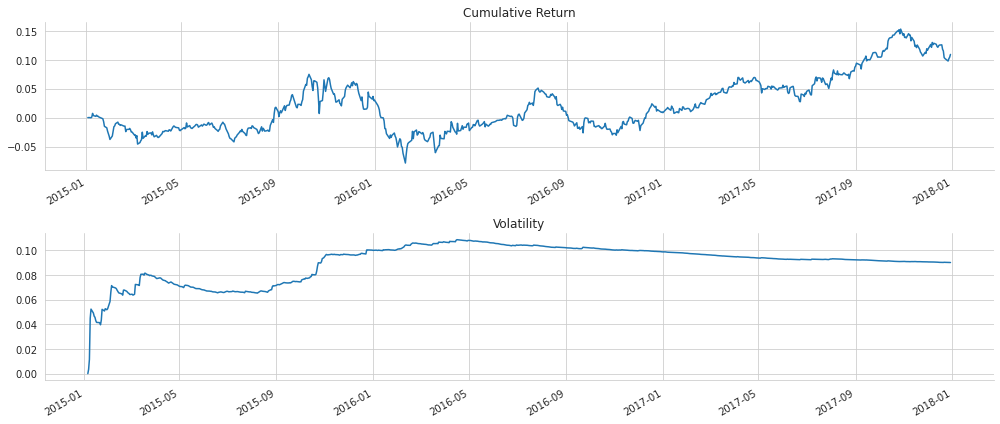

In [ ]:
fig, axes = plt.subplots(nrows=2, figsize=(14,6))
result.algorithm_period_return.plot(ax=axes[0], title='Cumulative Return')
result.algo_volatility.plot(ax=axes[1], title='Volatility')
sns.despine()
fig.tight_layout();

### 다양한 데이터 소스의 팩터 결합

### alphalens_tutorial_on_quantopian.ipynb

# Researching strategy ideas with Alphalens
- 내장된 퀀토피안 팩터


CREDITS:
Luca Scarabello,
Maxwell Margenot (some of this content comes from Factor Analysis Lecture),
Jessica Stauth (some plots interpretation ideas come from her talks)

## What is Alphalens?

Alphalens는 팩터가 미래 수익률을 예측하는 능력을 분석하는 도구입니다. Alphalens는 팩터 예측과 미래 수익률 사이의 상관관계를 검증하고 강조합니다.

직관적으로, 팩터는 자산 수익률을 설명하는 데 사용되는 모델이며, 미래 자산 가격 또는 수익률을 예측하는 데 사용됩니다. 팩터는 거래 대상 전체의 각 자산에 대해 예측된 미래 수익률을 나타내는 값인 점수를 할당합니다. 팩터의 예시는 다음과 같습니다:

- 모멘텀(Momentum): 장기 성과(예: 지난 1년 수익률)를 기반으로 주식에 점수를 매기며, 해당 주식이 해당 성과를 유지할 것으로 예상합니다.
- 평균회귀(Mean Reversion): 최근 성과의 역수(예: 지난 5일 수익률)로 주식에 점수를 매기며, 해당 주식 가격이 이동 평균으로 회귀할 것으로 예상합니다.
- 변동성(Volatility): 수익률의 표준 편차의 역수로 주식에 점수를 매깁니다.
- 크기(Size): 소형주 주식에 높은 점수를 부여합니다.
- 기본적인 펀더멘털 분석 (가치, 품질 등)
- 기술적 분석 (RSI, MACD, 볼린저 밴드 등)
- 센티먼트 팩터

Alphalens는 입력으로 과거 팩터 값을 자산 가격(또는 수익률)과 함께 받아들이고, 팩터 예측을 실제 과거 자산 성과와 비교하여 분석 보고서를 제공합니다. 이 보고서는 팩터가 자산 수익률을 설명하는 데 효과적인지 여부를 명확하게 확인하며, 또한 팩터의 예측 정확도를 측정합니다.

## Why Alphalens? Isn't backtesting enough?

연구 단계에서는 팩터의 특성을 이해하여 해당 팩터를 가장 잘 거래할 수 있는 방법을 파악하는 것에 관심이 있습니다. 백테스트는 시장의 상세한 시뮬레이션(수수료, 슬리피지, 자산 유동성)을 수행하고 알고리즘이 실제 거래에서 어떻게 수행될 것인지 매우 현실적인 기대치를 제공하지만, 팩터 자체의 품질과 특성을 평가하는 능력은 부족합니다. 백테스트가 좋은 결과를 보여준다면 해당 팩터가 알파를 갖고 있다는 것을 알지만, 그 알파를 극대화하기 위한 최적의 매개변수는 알지 못합니다. 백테스트가 나쁜 성과를 보여준다면 더 나쁜 상황에 처해있는데, 팩터에 대해 아무것도 모르기 때문입니다(잘못된 매개변수를 선택했을 수도 있고, 팩터 자체가 알파를 가지지 않을 수도 있습니다). 반면에 Alphalens로 팩터를 분석하면 알파가 있는지 여부와 해당 팩터를 거래하는 최적의 방법이 명확해집니다. 이 정보가 알려진 후에야 우리는 알파가 실제로 거래 가능한지 확인하기 위해 백테스트를 시작할 수 있습니다. 즉, 알파가 수수료, 슬리피지 및 주식 가용성(유동성)에서 살아남을 수 있는지 확인할 수 있습니다.

Alphalens 보고서를 살펴보면 다음과 같은 질문에 답을 할 수 있습니다:
- 팩터는 전혀 예측적인가요?
- 팩터는 얼마나 예측적인가요?
- 해당 팩터는 전체 주식 대상에서 일관성이 있나요?
- 롱 포지션에서 몇 개의 자산을 거래해야 할까요? 그리고 숏 포지션에서는 몇 개의 자산을 거래해야 할까요?
- 어떤 가중 체계를 사용해야 할까요? 팩터 가중치를 사용할까요? 아니면 동일한 가중치를 사용할까요?
- 어떤 보유 기간을 사용해야 할까요? 매일 리밸런스할까요? 아니면 매주 리밸런스할까요?
- 서로 다른 보유 기간에 대한 턴오버는 어떻게 되나요?
- 해당 팩터는 모든 섹터에서 잘 수행되나요? 해당 팩터를 섹터 중립 전략으로 거래할 수 있을까요?
- 변동성, 시가총액, 자산 가격, 모멘텀, 가격 대 분기 비율, 베타 노출 등 다른 수준에서 팩터의 성능은 어떻게 되나요?

# Testing Hypotheses

Alphalens는 다양한 전략과 함께 사용할 수 있는 다재다능한 도구입니다. 여기에서는 몇 가지 예시를 소개하겠습니다.

전략 아이디어는 기본적인 팩터인 [가치](https://www.quantopian.com/lectures/case-study-traditional-value-factor) 또는 [퀄리티](https://www.quantopian.com/posts/quality-factors-1) 팩터를 살펴보는 것과 같이 간단할 수 있습니다. Quantopian에서는 [기본 데이터](https://www.quantopian.com/help#ide-fundamentals)의 완벽한 범위를 제공합니다.

Alphalens는 감성 분석, CEO 변경, 주식 매수 승인, 합병 및 인수 등과 같은 [대체 데이터셋](https://www.quantopian.com/data)을 평가하는 데에도 사용할 수 있습니다.

기술적 분석에 속하는 전략들도 쉽게 검증할 수 있는 범위입니다. zipline에는 이미 구현된 [내장 팩터](https://github.com/quantopian/zipline/blob/master/zipline/pipeline/factors/technical.py) (예: RSI, 볼린저 밴드, 아룬, Fast Stochastic Oscillator, 일목균형표 등)가 있지만, 이미 제공되지 않은 경우 직접 구현할 수도 있습니다.

가끔 우리는 흥미로운 알고리즘을 발견할 수 있습니다. 예를 들어 [평균 회귀](https://www.quantopian.com/posts/enhancing-short-term-mean-reversion-strategies-1) 또는 [안드레아스 클레노우의 모멘텀](https://www.quantopian.com/posts/equity-momentum)과 같은 전략이 그 중 하나입니다. 이러한 전략의 성과를 뒷받침하는 요소가 무엇인지 궁금해집니다. 그래서 우리는 알고리즘을 복제하고, 여기저기 일부 설정을 변경하고, 백테스트를 실행하지만 전략의 핵심을 쉽게 이해하기 어렵습니다. 이는 알고리즘이 변수와 세부 사항이 너무 많아 전략 아이디어를 구현 방법과 분리하기가 어렵기 때문입니다. 그러나 알파를 알고리즘에서 분리하여 팩터로 코드화하고 Alphalens로 분석하면 실제로 무슨 일이 벌어지고 있는지 이해할 수 있습니다. 아이디어를 이해한 후에는 알고리즘을 살펴보고 구현 세부 사항에 의미를 부여하고 전략을 개선하는

 것이 더 쉬워집니다.

### Coding our factors
- 다양한 데이터 소스의 팩터 결합
- Zipline 설치 불가로 다른 라이브러리 불가능

Quantopian에서는 우리의 전략 아이디어를 [파이프라인](https://www.quantopian.com/tutorials/pipeline) 팩터로 쉽고 편리하게 구현할 수 있습니다. 이러한 이유로 우리는 파이프라인을 사용하여 예시를 설명할 것이지만, Alphalens는 파이프라인 없이도 작동할 수 있습니다. 일부 전략은 파이프라인을 사용하여 구축할 수 없습니다(예: 일중 전략이나 파이프라인을 통해 사용할 수 없는 데이터를 사용하는 전략) 하지만 팩터 및 가격 데이터를 수집할 수 있다면 여전히 Alphalens를 사용할 수 있습니다([여기에 몇 가지 예시](https://github.com/quantopian/alphalens/tree/master/alphalens/examples)가 있습니다).

이 튜토리얼을 위한 예시로, 우리는 모멘텀 팩터를 생성하고 Alphalens를 사용하여 성능을 분석할 것입니다.

In [35]:
!pip install alphalens

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.0/24.0 MB 36.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 23.6 MB/s eta 0:00:00
  Created wheel for alphalens: filename=alphalens-0.4.0-py3-none-any.whl size=24027552 sha256=7ef5068c1ac5e4d24e7f728eb0af51f3ad2f7ac43bbf4116cbf9cb24fa02809b
  Stored in directory: /root/.cache/pip/wheels/4b/58/a6/6536c00c2d092cab6164cfa0ba4a4e714887f5d5afd40cb731
  Created wheel for empyrical: filename=empyrical-0.5.5-py3-none-any.whl size=39762 sha256=0af20b99f8e2eef39e7ea96648c6391700548b9a61a973d29b1fe8185ee448e7
  Stored in directory: /root/.cache/pip/wheels/0e/2e/f2/d6d2d9a1eb8fbbd9949bb5d4c00f753e3b74e5bd7ed10b1d36
Successfully built alphalens empyrical


In [36]:
from quantopian.pipeline.factors import CustomFactor
from quantopian.pipeline.data.builtin import USEquityPricing

import numpy as np
import pandas as pd
import scipy.stats as stats

ModuleNotFoundError: ignored

In [ ]:
def _slope(ts, x=None):
    if x is None:
        x = np.arange(len(ts))
    log_ts = np.log(ts)
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, log_ts)
    return slope

class MyFactor(CustomFactor):
    """
    12 months Momentum
    Run a linear regression over one year (252 trading days) stocks log returns
    and the slope will be the factor value
    """
    inputs = [USEquityPricing.close]
    window_length = 252

    def compute(self, today, assets, out, close):
        x = np.arange(len(close))
        slope = np.apply_along_axis(_slope, 0, close, x.T)
        out[:] = slope

## Data preparation

Alphalens input consists of two type of information: the factor values for the time period under analysis and the historical assets prices (or returns). Alphalens doesn't need to know how the factor was computed,  the historical factor values are enough. This is interesting because we can use the tool to evaluate factors for which we have the data but not the implementation details.

Alphalens requires that factor and price data follows a specific format and it provides an utility function, `get_clean_factor_and_forward_returns`, that accepts factor data, price data and optionally a  group information (for example the sector groups, useful to perform sector specific analysis) and returns the data suitably formatted for Alphalens.

In [ ]:
import alphalens as al

In [ ]:
al.utils.get_clean_factor_and_forward_returns(factor,
                                              prices,
                                              groupby=None,
                                              binning_by_group=False,
                                              quantiles=5,
                                              bins=None,
                                              periods=(1, 5, 10),
                                              filter_zscore=20,
                                              groupby_labels=None,
                                              max_loss=0.35,
                                              zero_aware=False)

The meaning of the function parameters will become clear during this tutorial, but for now let's have a quick look at the most important of them:

- `quantiles`, `bins` and `binning_by_group`: used to split factor data into buckets. `bins` chooses the buckets to be evenly spaced according to the values themselves, while `quantiles` chooses the buckets so that you have the same number of records in each one. `binning_by_group` is used when breaking the analysis down by sector (or any other group) and it computes buckets separately for each group.

- `periods`: this is a list of integers that selects how far in the future we like to examine the factor/returns relationship, e.g. 1, 5 and 10 days. Alphalens will compute the forward/future returns for each period.

- `groupby` and `groupby_labels` :those are used to break the Alphalens analysis down by certain groups, usually by sector. This is useful to analyse of a factor performs across different groups.

Also please remember that you can always use the built-in function `help` on any functions (e.g. `help(al.utils.get_clean_factor_and_forward_returns)` ), which will give you up-to-date detailed information on the function and its arguments.

### Defining a universe

We need to define the [stock universe](https://www.quantopian.com/lectures/universe-selection) over which we like to perform our analysis. Since we like to find a strategy idea suitable for an [allocation](https://www.quantopian.com/allocation) there is no doubts we are using [QTradableStocksUS](https://www.quantopian.com/posts/working-on-our-best-universe-yet-qtradablestocksus).

In [ ]:
from quantopian.pipeline.filters import QTradableStocksUS

In [ ]:
universe = QTradableStocksUS()

 ### Collecting historical factor and price data

Now that we have defined the factor and the universe, we can run pipeline and collect the results, which will be the input to Alphalens.

Since Alphalens can break the factor analysis down by a customly defined group, we can optionally add the sector computation in the Pipeline, so that we will also be able to evaluate how the factor performs across different sectors.

In [ ]:
from quantopian.research import run_pipeline
from quantopian.pipeline import Pipeline
from quantopian.pipeline.classifiers.fundamentals import Sector

In [ ]:
pipe = Pipeline(
    columns = {
            'MyFactor' : MyFactor(mask=universe),
            'Sector' : Sector(mask=universe), # optional, useful to compute individual sector statistics
    },
    screen=universe
)

Since computing factor(s) over a long period of time (many years) requires lots of memory, we can use `chunksize` argument, which splits the Pipeline computation in a specific number of days (250 in the example below) limiting the memory usage.

In [ ]:
factors = run_pipeline(pipe, '2013-01-01', '2014-01-01', chunksize=250) # chunksize is optional
factors = factors.dropna()

In this example we are collecting a contiguous factor data over one year, but Alphalens can handle  gaps, for example it is allowed to join different periods of time or collect factor data only for certain days of the week. The factor data doesn't even need to be daily computed, Alphalens is time frequency agnostic and you can pass a factor computued every hour, minute or anything (even though we cannot use Pipeline for computing non-daily factors).

Also, as a general advice, It's not a good idea to run Alphalens on recent data during the research phase, this is because we want to keep the recent market data for out-of-sample testing.

In [ ]:
print factors.head()

                                             MyFactor  Sector
2013-01-02 00:00:00+00:00 Equity(2 [ARNC])  -0.000726     101
                          Equity(24 [AAPL])  0.000940     311
                          Equity(31 [ABAX])  0.001594     206
                          Equity(39 [DDC])   0.000388     101
                          Equity(52 [ABM])  -0.000777     310


The other information required by Alphalens are the stock prices for which the factor is computed, so we first find the assets under analysis.

In [ ]:
asset_list = factors.index.levels[1].unique()

Then we fetch the prices. The price information should start with the first date of your factor data and end with the last date in the factor data plus the maximum number of days in the periods argument (later on this). Alphalens will not compute statistics for the factor values for which there is no price information, which means it not a big deal if only few days are missing.

In [ ]:
prices = get_pricing(asset_list, start_date='2013-01-01', end_date='2014-02-01', fields='open_price')

It is important to pass the correct pricing data to avoid lookahead bias or delayed calculations. The pricing data must contain at least an entry for each timestamp/asset combination in the factor. This entry should reflect the buy price for the assets and usually it is the next available price after the factor is computed but it can also be a later price if the factor is meant to be traded later. With Pipiline the factor values are computed before market open, so we need to pass the daily open price to Alphalens, since they are the earliest availble prices after the factor computation.
The pricing data is also needed for the assets sell price, the asset price after 'period' timestamps will be considered the sell price for that asset when computing 'period' forward returns.

See `help(al.utils.get_clean_factor_and_forward_returns)` for more interesting details on prices.

In [ ]:
prices.head()

,Equity(2 [ARNC]),Equity(24 [AAPL]),Equity(31 [ABAX]),Equity(39 [DDC]),Equity(41 [ARCB]),Equity(52 [ABM]),Equity(53 [ABMD]),Equity(62 [ABT]),Equity(64 [ABX]),Equity(67 [ADSK]),...,Equity(44158 [XOOM]),Equity(44249 [APAM]),Equity(44270 [SSNI]),Equity(44330 [AVIV]),Equity(44375 [PF]),Equity(44433 [TMHC]),Equity(44466 [EVTC]),Equity(44467 [RALY]),Equity(44508 [CST]),Equity(44510 [FWM])
2013-01-02 00:00:00+00:00,8.760,540.247,38.00,14.24,9.659,19.739,13.69,31.604,35.118,36.05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-03 00:00:00+00:00,8.849,534.453,37.92,13.99,9.639,19.876,13.74,32.192,34.678,36.75,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-04 00:00:00+00:00,8.987,523.805,37.96,14.18,9.768,20.110,13.44,32.612,33.300,36.53,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-07 00:00:00+00:00,9.154,509.207,37.34,13.92,9.996,20.159,13.31,32.309,33.573,36.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-08 00:00:00+00:00,9.036,516.240,37.40,14.33,9.748,20.023,13.28,32.573,33.280,36.15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Formatting the data for Alphalens

Now that we have all the required information we can call `get_clean_factor_and_forward_returns`, which will return the data suitably formatted for Alphalens.

This function requires few important arguments: quantiles and periods.

The factor evaluation process performed by Alphalens is based on the analysis between factor values and their future returns. The `periods` argument tells Alphalens how far in the future we like to examine the returns. In our example we are interested in multiple days: 1, 5 and 10 days. Alphalens will compute the forward/future returns for each period, which are the returns that we would receive for holding each factor value for the specified number of days. It is worth mentioning that commission or slippage cost are not considered in Alphalens.

Since financial market data are extremely noisy, it would be very hard to find a correlation between a specific factor value and future returns. For this reason Alphalens computes the statistics on factor `quantiles` instead on the factor values themselves. Quantiles are created taking the daily factor values distribution and split it into equal-sized buckets based on their values. This operation is done on a daily basis. The idea behind quantiles is that grouping stocks helps to increase the signal-to-noise ratio.

In [ ]:
factor_data = al.utils.get_clean_factor_and_forward_returns(
    factor=factors["MyFactor"],
    prices=prices,
    quantiles=5,
    periods=(1, 5, 10))

Dropped 0.0% entries from factor data: 0.0% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


There is also an optional group information that has to be provided only if we are interested in breaking down the analyzis by a certain group (e.g. by sector). We have to provide the group each asset belongs to (`groupby=factors["Sector"]`) and optionally a description for the group (`groupby_labels=sector_labels`), which is useful to plot meaningful names instead of dull numeric values.

In [ ]:
sector_labels = dict(Sector.SECTOR_NAMES)
sector_labels[-1] = "Unknown" # no dataset is perfect, better handle the unexpected
print(sector_labels)

{101: 'BASIC_MATERIALS', 102: 'CONSUMER_CYCLICAL', 103: 'FINANCIAL_SERVICES', 104: 'REAL_ESTATE', 205: 'CONSUMER_DEFENSIVE', 206: 'HEALTHCARE', 207: 'UTILITIES', 308: 'COMMUNICATION_SERVICES', 309: 'ENERGY', 310: 'INDUSTRIALS', 311: 'TECHNOLOGY', -1: 'Unknown'}


In [ ]:
factor_data = al.utils.get_clean_factor_and_forward_returns(
    factor=factors["MyFactor"],
    prices=prices,
    groupby=factors["Sector"],    # optional, useful to compute group statistics (e.g. sector)
    groupby_labels=sector_labels, # optional, use labels instead of numeric group information
    quantiles=5,
    periods=(1, 5, 10))

Dropped 0.0% entries from factor data: 0.0% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


In [ ]:
factor_data.head()

1D        5D       10D  \
date                      asset                                             
2013-01-02 00:00:00+00:00 Equity(2 [ARNC])   0.010160  0.050685  0.000000   
                          Equity(24 [AAPL]) -0.010725 -0.056552 -0.106857   
                          Equity(31 [ABAX]) -0.002105  0.000000  0.030000   
                          Equity(39 [DDC])  -0.017556  0.008427  0.069522   
                          Equity(52 [ABM])   0.006941  0.016819  0.013881   

                                               factor            group  \
date                      asset                                          
2013-01-02 00:00:00+00:00 Equity(2 [ARNC])  -0.000726  BASIC_MATERIALS   
                          Equity(24 [AAPL])  0.000940       TECHNOLOGY   
                          Equity(31 [ABAX])  0.001594       HEALTHCARE   
                          Equity(39 [DDC])   0.000388  BASIC_MATERIALS   
                          Equity(52 [ABM])  -0.000777      INDUSTRIALS   

                                             factor_quantile  
date                      asset                               
2013-01-02 00:00:00+00:00 Equity(2 [ARNC])                 1  
                          Equity(24 [AAPL])                4  
                          Equity(31 [ABAX])                5  
                          Equity(39 [DDC])                 3  
                          Equity(52 [ABM])                 1

This is how the formatted data looks like: 1, 5 and 10 columns are the forward returns, factor it's the original factor value and `factor_quantile` is the quantile where the specific factor value falls in.

This is the data format required by Alphalens functions, if you have other means to obtain the data in this format you can skip the call to `al.utils.get_clean_factor_and_forward_returns`.

## Running Alphalens

Once the factor data is ready, running Alphalens analysis is pretty simple and it consists of one function call that generates the factor report (statistical information and plots). Please remember that it is possible to use the `help` python built-in function to view the details of a function.

In [ ]:
al.tears.create_full_tear_sheet(factor_data, long_short=True, group_neutral=False, by_group=False)

There is also a simplified version of the report that avoids most of the plots but keeps the statistics,. This function might come in handy to experienced users who don't need all the fancy plots and prefer to look at raw numbers.

In [ ]:
al.tears.create_summary_tear_sheet(factor_data, long_short=True, group_neutral=False)

Additionally, subsets of the factor report are avaliable through the functions below.

In [ ]:
al.tears.create_returns_tear_sheet(factor_data, long_short=True, group_neutral=False, by_group=False)

al.tears.create_information_tear_sheet(factor_data, group_neutral=False, by_group=False)

al.tears.create_turnover_tear_sheet(factor_data)

al.tears.create_event_returns_tear_sheet(factor_data, prices,
                                         avgretplot=(5, 15),
                                         long_short=True,
                                         group_neutral=False,
                                         std_bar=True,
                                         by_group=False)

There are some options that are common to several tear sheet API and those options influence the way the report is performed:

- `long_short` : This option adjusts the returns analysis assuming the factor is meant to be used in a long-short dollar neutral strategy.
- `group_neutral` : This option adjusts the returns and information analysis  assuming the factor is meant to be used in a group neutral strategy, that is the factor is equally invested in each group (e.g. sector). This option requires the group information to be present in factor_data. When using this option it is useful to also enable `binning_by_group` (explained later) when calling `get_clean_factor_and_forward_returns`. This option requires the group information to be present in factor_data.
- `by_group`: If True, additional plots are displaied separately for each group. This option requires the group information to be present in factor_data.

The `long_short` flag is useful to model factors that provide relative scores, instead of absolute score. Relative means that the factor tells us how each stock performs with respect to the other stocks (better or worse), but we cannot make assumptions on the absolute value of the returns. The concept of relative score is very important because it is the fundations of [Beta hedging](https://www.quantopian.com/lectures/beta-hedging) and [Long-Short Equity strategies](https://www.quantopian.com/lectures/long-short-equity).
There are only few cases where you want to disable the `long_short` flag. For example if you like to trade only the top quantile of a factor in a long only strategy and you want to analyze the absolute performance of the quantile, not the relative performance ones.

Similarly to the `long_short` flag that simulates a long-short dollar neutral strategy that is useful to hedge Beta, the `group_neutral` option simulates a group neutral strategy that is useful hedge against sector exposure. To better understand the Beta and Sectors hedging you might want to have a look at the lectures: Why You Should Hedge Beta and Sector Exposures? [1](https://www.quantopian.com/lectures/why-you-should-hedge-beta-and-sector-exposures-part-i) and [2](https://www.quantopian.com/lectures/why-you-should-hedge-beta-and-sector-exposures-part-ii) and the [Quantopian Risk Model](https://www.quantopian.com/risk-model).

We will now have a look at the Alphalens report to understand how to interpret it.
Note: have a look at "Predictive vs non-predictive factor" jupiter NB in [here](https://github.com/quantopian/alphalens/tree/master/alphalens/examples) for a comparison between a predictive and a non-predictive factor

### Understanding Alphalens Report part 1:  Event-Study-Like Return

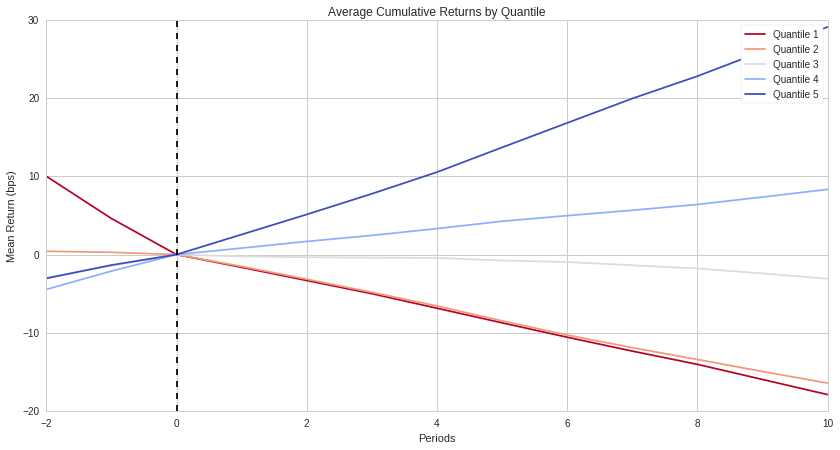

In [ ]:
al.tears.create_event_returns_tear_sheet(factor_data, prices,
                                         avgretplot=(2,10),
                                         long_short=True,
                                         group_neutral=False,
                                         std_bar=False,
                                         by_group=False)

This plot shows an overview of the factor performance few days before and few days after (`avgretplot=(2,10)`) the factor signal.  On the X axis we have the time (days before and after the signal): the vertical line at day 0 is when the signal happens (the factor computation) and we can see the quantile average returns from 2 days before to 10 days after that.

The periods we chose when we call `get_clean_factor_and_forward_returns` are the ones for which we will get more detailed information in the other parts of the factor report, but in this plot we can see an overview of the performance across the full period.

If `long_short=True` the forward returns are demeaned by the factor universe mean return, which means  the market effect is removed from the returns and we can better observe the relative performance between quantiles. This is exactly what we are interested in a long-short dollar neutral strategy.

Below we can see the absolute performance with `long_short=False`. The market influence is very clear,  the returns increase on average, independently of the quantile.

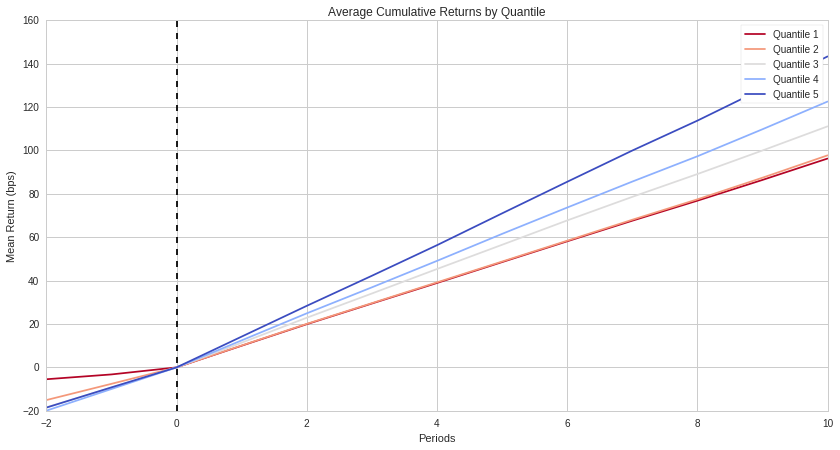

In [ ]:
al.tears.create_event_returns_tear_sheet(factor_data, prices,
                                         avgretplot=(2,10),
                                         long_short=False,
                                         group_neutral=False,
                                         std_bar=False,
                                         by_group=False)

if `group_neutral=True` the quantile cumulative returns are computed separately for each group (sector), demeaned at group level and finally averaged together. This reflects what would have happened in a sector neutral strategy where for each sector the top and bottom factor values assets are selected and traded giving each sector equal weighting.

### Understanding Alphalens Report part 2: Returns Analysis

Returns Analysis


,1D,5D,10D
Ann. alpha,0.022,0.042,0.062
beta,0.129,0.084,0.029
Mean Period Wise Return Top Quantile (bps),2.585,2.762,2.951
Mean Period Wise Return Bottom Quantile (bps),-1.644,-1.755,-1.810
Mean Period Wise Spread (bps),4.214,4.489,4.713


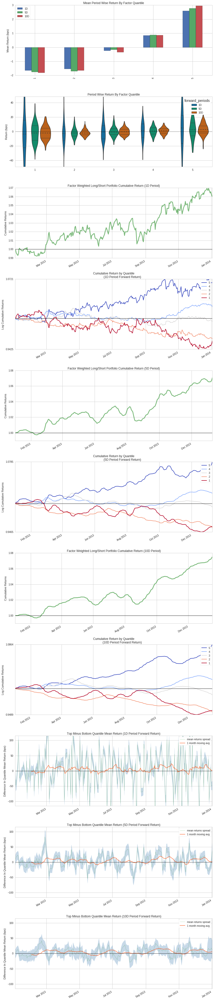

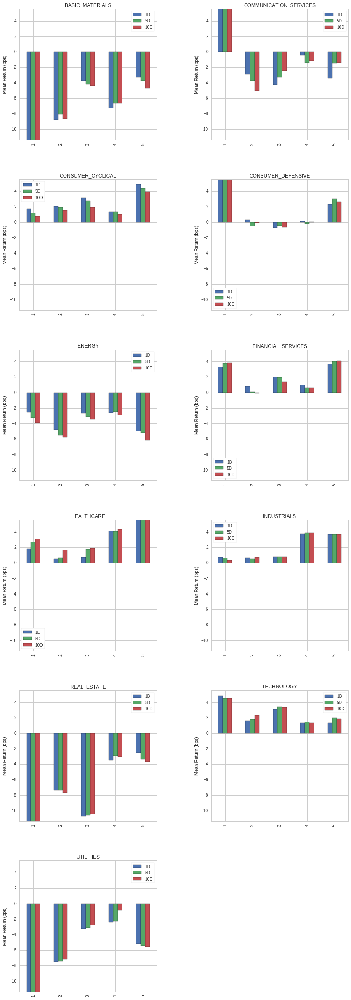

In [ ]:
al.tears.create_returns_tear_sheet(factor_data,
                                   long_short=True,
                                   group_neutral=False,
                                   by_group=True)

#### Mean Period Wise Return by Factor Quantile

This plot is generated computing the mean forward return of each quantile, each day independently and averaging them at the end. This plot is telling us what return we would have made on average if we had held a specific quantile (the full stocks belonging to that quantile) for 1, 5 or 10 days or, put it in another way, what return do I get 1, 5 or 10 days in future based on factor information I know today. In this plot there are actually two different points in time: the present is the X axis, which defines the quantiles and is an information available at trading time, and the future is the Y axis, the mean forward return that a specific quantile generates on average. This latter information is not know at trading decision time, but if a factor has proven to be consistent in the past there is a good chance it keeps performing well.

What defines a predictive factor in a long-short strategy is the spread between the top and bottom quantiles. More precisely we want to see the stocks in the bottom quantiles to have negative returns and the stocks in the upper quantiles ot have positive returns. This makes sense because in a long-short strategy we long the top stocks and short the bottom ones.

Another interesting aspect of the plot is that we can see the mean returns for different periods side by side and compare them. This makes clear how long for we have to hold the securities to maximize the returns. There is a subtlety that is worth mention, though. We cannot directly compare the the 1 day mean return to 5 days (or any other days) mean return. To make sensible the comparison between different periods Alphalens shows the rate of returns. The rate of return is the value the returns would have been every day if they had grown at a steady rate. Alphalens uses the shortest period length as the base time frequency over which computing the rate of returns. So, for example, if we had 1, 5, and 10 days periods Alphalens would compute 1 day rate of retuns for all the periods and if we had 10 and 30 days (or minutes) as periods Alphalens would compute 10 days (or minutes) rate of returns.

If `long_short=True` the forward returns are demeaned by the factor universe mean return, which results in a vertical shift of the plot (the Y axis), so that all the quantiles are centered around 0 (which represents the market). That makes easier to evaluate quantiles relative performance but the plots make sense only if the factor is traded in a dollar neutral strategy. If you plan to trade the factor in a long only strategy, then you want to set `long_short=False` to see the actual absolute performance of the quantiles.

if `group_neutral=True` is similar to `long_short` option expect the forward returns are  demeaned at group level.

#### Period Wise Return by Factor Quantile (Violin plots)

The explanation from the above plot applies to this plot too except that this plot shows the full distribution of quantile forward returns  instead of computing the mean. Looking at the variance of daily return distribution we can have a sense of how noisy our factor is.  Averaging and reducing data is useful because it allows to evaluate and quantify large amount of data but it is also good to have a sense of the reality, what kind of data we are dealing with.

#### Factor weighted Long/Short Portfolio Cumulative Return

This plot simulates what a portfolio would have returned if we had traded the full stock universe using the factor values as position weights. There is no concept of quantiles in this plot.

Even though a real strategy would trade only the top and bottom quantiles and not the full factor, with improved performance, this plot gives a sense of how predictive the factor is as a whole; the more consistent the factor is across the full universe the more this plot shows good results. The more consistency we see in this plot the more likely we trust the factor in explaining the stock returns. Also if the factor is consistent across the universe we probably want to weigh the portfolio positions by factor value, as opposite to an equal weighting scheme.

How are weights computed in the plot?

If `long_short=True` the assets weights are computed by demeaning factor values by mean factor universe and dividing by the sum of their absolute value (achieving gross leverage of 1).
If `long_short=False` the assets weights are computed dividing the factor values by the sum of their absolute value (achieving gross leverage of 1). Positive factor values will generate long positions and  negative factor values will produce short positions so that a factor with only positive values will result in a long only portfolio.

if `group_neutral=True` simulates a group neutral portfolio: the portfolio weights are computed so that each group will weigh the same, the factor values demeaning occurs on the group level resulting in a dollar neutral, group neutral,  long-short portfolio.

#### Cumulative Return By Quantile

Similarly to the previous plot we are here looking at cumulative return but this time each quantile is considered on its own and the cumulative return are computed from the quantile daily mean returns, so each asset in the quantile weigh the same.

This plot is particularly useful to check if the factor is robust in sorting performance across the quantiles. What we want to see is the top quantiles increasing in value and the bottom quantiles decreasing in value and the relative performance should be in accordance with quantile number: monotonically increase in performance for the top half quantiles and monotonically decrease in performance for the bottom half quantiles.

Another interesting aspect of this plot is that we can see the actual performance of the top and bottom  quantiles individually. Since this is the way the factor would actually be traded in a strategy (top quantile will be the long leg and bottom quantile the short leg) we can see the performance of the long and short leg of the strategy.

If long_short=True the forward returns are demeaned by the factor universe mean return, which means the market effect is removed from the returns and we can better observe the relative performance between quantiles that is exactly what we are interested in a long-short dollar neutral strategy.

if `group_neutral=True` is similar to `long_short` option expect the forward returns are  demeaned at group level.

#### Note on cumulative return plots

Here is a note regarding the cumulative returns computation in Alphalens.

Since we are computing the factor daily, via Pipeline, if period is greater than 1 day the returns happening on one day overlap the returns happening the following days, this is because new daily factor values are computed before the previous returns are realized. if we have new factor values  but we haven’t exited the previous positions yet, how can we trade the new factor values?

Let’s consider for example a 5 days period. A first solution could be to trade the factor every 5 days instead of daily. Unfortunately this approach has several drawbacks. One is that depending on the starting day of the algorithm we get different results, but the most important issue comes from [The Fundamental Law of Asset Management](https://www.quantopian.com/lectures/why-you-should-hedge-beta-and-sector-exposures-part-i) which states:

IR = IC √BR

The more independent bets we make the higher IR we get. In a year we have 252 trading days, if we rebalance every 5 days we have 252/5= ~50 bets instead of 252. We don't really want to decrease our performance decreasing the bets, so here is the solution:

Given a period N, the cumulative returns are computed building and averaging N interleaved sub portfolios (each started at subsequent periods 1,2,..,N) each one rebalancing every N periods and each trading 1/Nth of the initial capital. This corresponds to an algorithm which split its initial capital in N sub capitals and trades each sub capital independently, each one rebalancing every N  days. Since the sub portfolios are started in subsequent days the algorithm trades every single day.

Compared to an algorithm that trades the factor every N day, this method increases the IR , has lower volatility, the returns are independent from the starting day and, very important, the algorithm capacity is increased by N times since the capital is split between N subportfolios and the slippage impact is decreased by N.

For more details see `help(al.performance.cumulative_returns)`

#### Top Minus Bottom Quantile Mean Return

Since in a real strategy we are interested in trading only the top and bottom quantiles and not the full factor, we can see in this plot the daily returns computed as the spread between the long and short quantile. This highlights very clearly the drawdown periods, where the plot is under 0, from the periods of positive returns. The shaded blue area illustrates an error band around the mean top minus bottom quantile returns. By default, the error band is one standard deviation above/below.

### Understanding Alphalens Report part 3: Information Coefficient Analysis

Information Analysis


,1D,5D,10D
IC Mean,0.016,0.027,0.035
IC Std.,0.118,0.107,0.084
Risk-Adjusted IC,0.140,0.248,0.420
t-stat(IC),2.230,3.951,6.685
p-value(IC),0.027,0.000,0.000
IC Skew,-0.058,0.229,0.365
IC Kurtosis,-0.240,0.110,-0.019


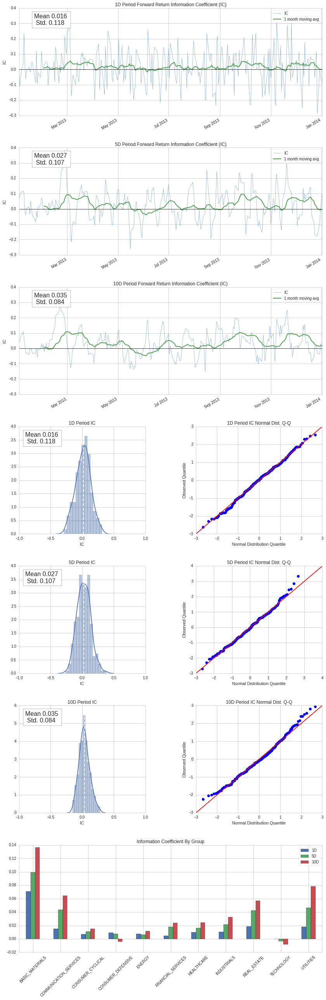

In [ ]:
al.tears.create_information_tear_sheet(factor_data,
                                       group_neutral=False,
                                       by_group=True)

#### Forward Return Information Coefficient

Information Coefficient is another way at looking at a factor predictivity. The IC is computed as the [Spearman Rank Correlation](https://www.quantopian.com/lectures/spearman-rank-correlation) between factor values and forward returns. In this plot we can see the rolling correlation between the factor and the forward returns.

The IC gives information on how well the factor sorts stocks across the whole distribution of data relatively to future returns. If we have an IC of 1 it means the relative order of factor values, the rank, is the same as the future returns, while -1 is the opposite. So the IC tells us how well the order in the factor values is kept in the future returns.  The IC is interesting because in a long-short strategy what matters is the relative performance among the stocks.

Positive IC values between 0.1 and 0.3 are good ones, as long as they are consistent in time.


#### Information Coefficient Distributions (Histogram and Q-Q plot)

This is just another way of looking at the IC shown in the previous plot. Different ways of presenting the data highlights different features.

In the histogram plots we see the daily IC distribution, which makes easy to check for consistency over time. We would like to see a positive mean IC and above the standard deviation.

The QQ plot compares the distribution of the IC to the normal distribution. This is useful for assessing if the IC is normally distributed or not. If the factor is predictive the IC distribution can't be normally distributed, what we want to see here is an S-shaped curve. This indicates that the tails of the IC distribution are fatter and contain more information.

### Understanding Alphalens Report part 4: Turnover Analysis

Turnover Analysis


,10D,1D,5D
Quantile 1 Mean Turnover,0.072,0.008,0.037
Quantile 2 Mean Turnover,0.161,0.018,0.082
Quantile 3 Mean Turnover,0.188,0.021,0.097
Quantile 4 Mean Turnover,0.160,0.018,0.082
Quantile 5 Mean Turnover,0.077,0.008,0.039


,1D,5D,10D
Mean Factor Rank Autocorrelation,1.0,0.998,0.991


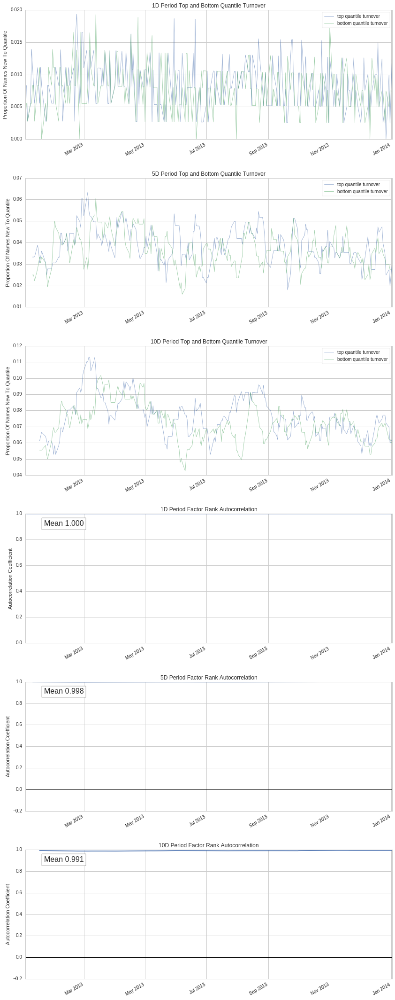

In [ ]:
al.tears.create_turnover_tear_sheet(factor_data)

#### Top And Bottom Quantile Turnover

In this plot is is shown the proportion of names in a factor quantile that were not in that quantile in the previous period.

When considering the impact of actually implementing a signal in a strategy, turnover is a critical thing to consider. This plot shows the turnover of the top and bottom quantiles of your factor, the baskets that you would actually be trading on with a long-short approach. Excessive turnover will eat away at the profits of your strategy through commission costs.


#### Factor Rank Autocorrelation

Factor autocorrelation is the measure of correlation between the current factor value rank and its previous value. The idea behind its calculation is to provide another measure of the turnover of the factor quantiles. If the autocorrelation is low, it implies that the current value of the factor has little to do with the previous value and that portfolio positions are changing frequently from time period to time period. If the next value of the factor is significantly influenced by its last value, this means that your ranking scheme is more consistent (though this has no influence on its ability to forecast relative price movements).

# Running Pyfolio from Alphalens

## Portfolio analysis

Alphalens can simulate the performance of a portfolio built using the factor values as assets weights. The result of this simulation can then be be analyzed by Pyfolio. The function we use to simulate the portfolio is:

In [ ]:
al.performance.create_pyfolio_input(factor_data,
                                    period,
                                    capital=None,
                                    long_short=True,
                                    group_neutral=False,
                                    equal_weight=False,
                                    quantiles=None,
                                    groups=None,
                                    benchmark_period='1D')

It has many options that influence the portfolio simulation and you can view their details with  `help(al.performance.create_pyfolio_input)`.  Here we provide a summary:

- `period` : 'period' returns to be used in the computation of the porfolio. The period must be one of the periods computed by al.utils.get_clean_factor_and_forward_returns.

- `capital` : capital used in the simulation. This doesn't have much of an impact, it is used to scale the assets weigthts to an actual dollar value. This is required by Pyfolio.

- `long_short` and `group_neutral` :  those option work accordingly to what we saw in the Alphalens return analysis.  `long_short` is used to simulate a dollar neutral long-short portfolio and `group_neutral` to simulate a group neutral portfolio (provided that the group information is present in `factor_data`).

- `equal_weight` : if True the assets will be equal-weighted otherwise they will be factor-weighed

- `quantiles`: select specific quantiles to be used in the computation. By default all quantiles are used

- `groups`: select specific groups to be used in the computation. By default all groups are used

Using those options we can mimic the performance we saw in the "Factor weighted Portfolio Cumulative Return" plot. To do so we have to set set `equal_weight=False` (factor weighted insted of equal weighting), `quantiles=None` (use all quantiles) and `groups=None` (use all groups).

Now let's try that. Since we saw in Alphalens report that quantiles 1 and 5 are the most predictive, we'll simulate  a portfolio where only those quantiles are traded.

In [ ]:
pf_returns, pf_positions, pf_benchmark = \
    al.performance.create_pyfolio_input(factor_data,
                                        period='5D',
                                        capital=1000000,
                                        long_short=True,
                                        group_neutral=False,
                                        equal_weight=True,
                                        quantiles=[1,5],
                                        groups=None,
                                        benchmark_period='1D')

As we can see, the benchmark returns are returned as well. Benchmark returns are computed as the factor universe mean returns traded at 'benchmark_period' frequency. This benchmark can be passed to pyfolio, which prevent it from using the default benchmark SPY. This might be useful to compare the strategy performance with the performance of the universe you are actually using, instead of relying on SPY.

Now that we have prepared the data we can run Pyfolio functions

In [ ]:
import pyfolio as pf

Start date,2013-01-02
End date,2014-01-09
Total months,17
,Backtest
Annual return,4.1%
Cumulative returns,6.1%
Annual volatility,1.1%
Sharpe ratio,3.54
Calmar ratio,3.85
Stability,0.92
Max drawdown,-1.1%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,1.06,2013-05-16,2013-06-06,2013-06-27,31
1,0.98,2013-08-07,2013-08-19,2013-09-16,29
2,0.71,2013-10-20,2013-10-30,2013-11-27,28
3,0.67,2013-03-06,2013-03-18,2013-04-15,29
4,0.65,2013-01-15,2013-02-13,2013-02-28,33


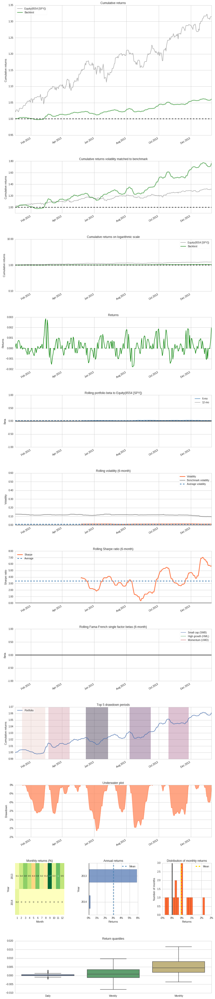

Stress Events,mean,min,max
New Normal,0.02%,-0.18%,0.28%


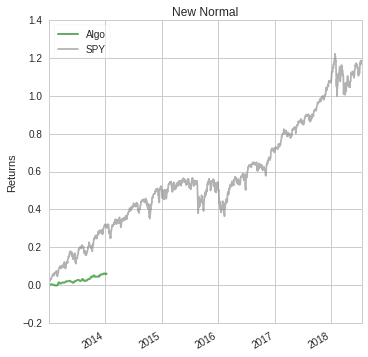

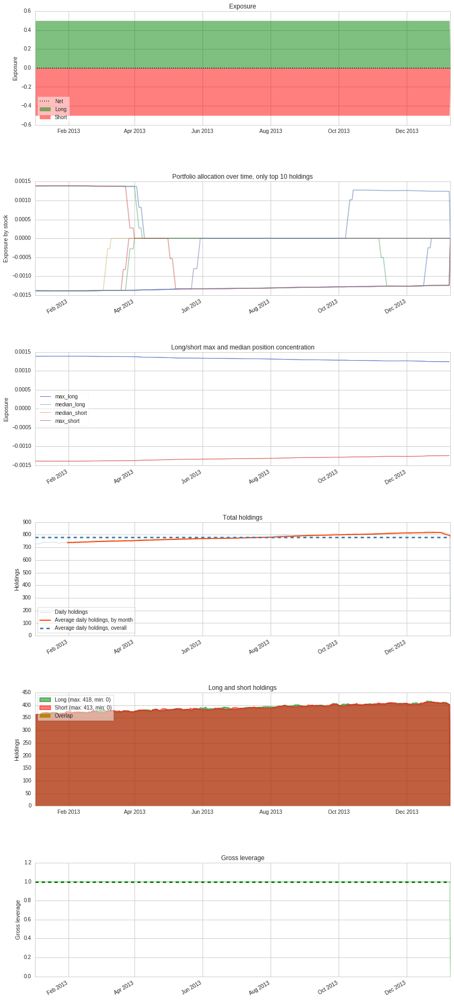

In [ ]:
pf.tears.create_full_tear_sheet(pf_returns,
                                positions=pf_positions,
                                #benchmark_rets=pf_benchmark, # optional, default to SPY
                                hide_positions=True)

###  Risk Exposure

Once you have found a predictive factor you want to take into consideration the risk associated with it and Quantopian provides a [risk model](https://www.quantopian.com/posts/introduction-to-the-quantopian-risk-model-in-research) that helps you with this analysis.

To perform the risk analysis we need to load the factor loadings and returns associated with the assets  in the traded universe.

In [ ]:
from quantopian.research.experimental import get_factor_loadings, get_factor_returns

In [ ]:
asset_list = factor_data.index.levels[1].unique()
start_date = factor_data.index.levels[0].min()
end_date   = factor_data.index.levels[0].max()

factor_loadings = get_factor_loadings(asset_list, start_date, end_date)
factor_returns = get_factor_returns(start_date, end_date)

Pyfolio expects factor_loadings to have specific index names

In [ ]:
factor_loadings.index.names = ['dt', 'ticker']

/usr/local/lib/python2.7/dist-packages/pyfolio/perf_attrib.py:589: UserWarning: Could not find factor loadings for 120 dates: (first missing is 2013-01-05 00:00:00+00:00, last missing is 2014-01-09 00:00:00+00:00). Truncating date range for performance attribution. 
  warnings.warn(warning_msg)


## Performance Relative to Common Risk Factors

Summary Statistics,
Annualized Specific Return,0.56%
Annualized Common Return,5.10%
Annualized Total Return,5.76%
Specific Sharpe Ratio,0.23


Exposures Summary,Average Risk Factor Exposure,Annualized Return,Cumulative Return
basic_materials,-0.04,-1.14%,-1.15%
consumer_cyclical,0.06,1.91%,1.91%
financial_services,0.03,0.96%,0.96%
real_estate,-0.01,0.23%,0.23%
consumer_defensive,0.00,-0.14%,-0.14%
health_care,0.03,1.12%,1.12%
utilities,-0.01,-0.02%,-0.02%
communication_services,-0.00,-0.07%,-0.07%
energy,-0.04,-1.16%,-1.17%
industrials,0.03,0.83%,0.84%


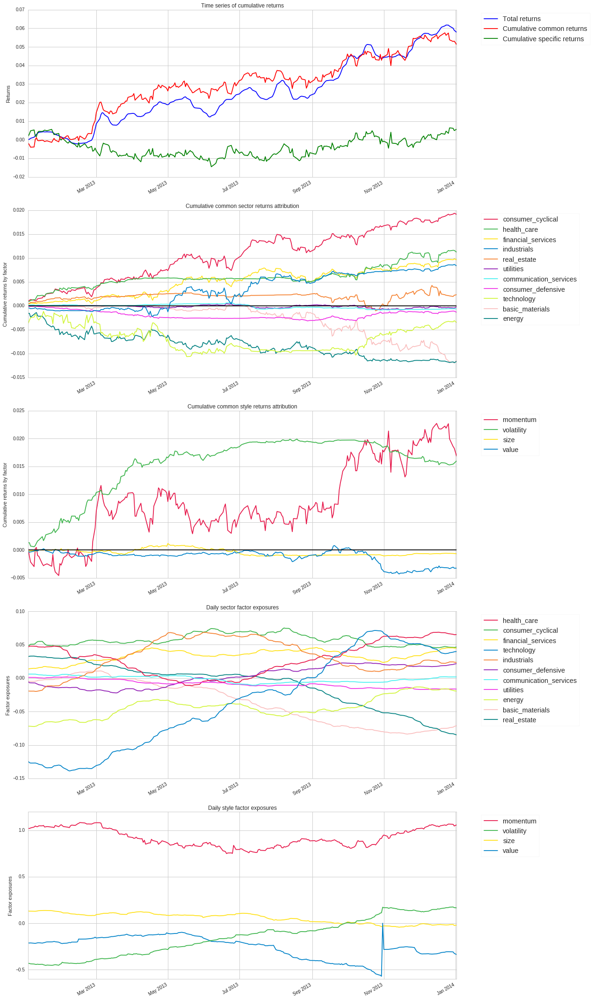

In [ ]:
pf.tears.create_perf_attrib_tear_sheet(pf_returns,
                                       positions=pf_positions,
                                       factor_returns=factor_returns,
                                       factor_loadings=factor_loadings,
                                       pos_in_dollars=True)

# Adavanced topics

## More on quantiles

Let's go back to the the data preparation stage and dig into the details of quantiles generation.

First let's have a look at the quantiles information we used in the Momentum factor analysis:

In [ ]:
al.plotting.plot_quantile_statistics_table(factor_data)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-0.010408,0.000293,-0.000929,0.001145,95950,20.021367
2,-0.000619,0.000857,0.000387,0.000312,95797,19.989442
3,0.000044,0.001380,0.000888,0.000300,95800,19.990068
4,0.000501,0.002120,0.001406,0.000354,95797,19.989442
5,0.001015,0.011105,0.002657,0.001147,95894,20.009682


We can see from `amount` column that each quantile contains an equal amount of entries, but it is also possible to create non-equal-sized buckets. We can do so by passing a custom sequence of quantiles, e.g. `quantiles=[0, .05, .30, .50, .70, .95, 1.00]`. This might be useful if we suspect the factor doesn't perform equally well across all the values, e.g. we  might want to analyze in a separate quantile the extreme top/bottom value, suspecting for a strange behaviour of the outliers.

In [ ]:
alternative_binning_factor_data = al.utils.get_clean_factor_and_forward_returns(
    factor=factors["MyFactor"],
    prices=prices,
    quantiles=[0, .05, .30, .50, .70, .95, 1.00],
    bins=None,
    periods=(1, 5, 10))

Dropped 0.0% entries from factor data: 0.0% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


In [ ]:
al.plotting.plot_quantile_statistics_table(alternative_binning_factor_data)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-0.010408,-0.001040,-0.002466,0.001201,24082,5.025061
2,-0.002053,0.000624,-0.000151,0.000512,119762,24.990088
3,-0.000251,0.001128,0.000651,0.000297,95844,19.999249
4,0.000291,0.001697,0.001130,0.000317,95741,19.977756
5,0.000729,0.003601,0.001936,0.000532,119752,24.988002
6,0.002053,0.011105,0.004061,0.001380,24057,5.019844


## Bins

`quantiles` option chooses the buckets to have the same number of items but it doesn't take into consideration the factor values. For this reason there is another option `bins`, which chooses the buckets to be evenly spaced according to the values themselves.

Let's have a look at RSI factor. The RSI, whose values range from 0 to 100, provides a signal that tells investors to buy when the currency is oversold and to sell when it is overbought, which it provides an indication of market reversal. The thresholds are usually set to 70 and 30, but more stringent ones may be chosen like 80/20 or 90/10.

In [ ]:
from quantopian.pipeline.factors import RSI

In [ ]:
pipe = Pipeline(
    columns = {
            'RSI' : RSI(mask=universe),
    },
    screen=universe
)
more_factors = run_pipeline(pipe, '2014-01-01', '2015-01-01')
asset_list = more_factors.index.levels[1].unique()
prices = get_pricing(asset_list, start_date='2014-01-01', end_date='2015-02-01', fields='open_price')

Let's see how our RSI factor reacts to the quantization:

In [ ]:
rsi_factor_data = al.utils.get_clean_factor_and_forward_returns(
    factor=more_factors["RSI"],
    prices=prices,
    quantiles=5,
    bins=None,
    periods=(1, 5, 10))

Dropped 0.0% entries from factor data: 0.0% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


In [ ]:
al.plotting.plot_quantile_statistics_table(rsi_factor_data)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,0.000000,61.722488,30.666442,10.722765,107350,20.018648
2,18.994431,71.589205,43.852199,9.983730,107198,19.990303
3,26.613516,77.943332,52.063103,10.084194,107206,19.991795
4,33.404482,84.375000,60.337646,9.860922,107195,19.989744
5,42.258065,100.000000,73.280406,10.360761,107301,20.009510


That doesn't seem right. If the quantiles are choosen irrespectively of the factor values we won't be able to analyze the signal at different thresholds. For this reason we will use the `bins` option, which allows to custom ranges too, the same as `quantiles`, but this time they are factor value based.

In [ ]:
rsi_factor_data = al.utils.get_clean_factor_and_forward_returns(
    factor=more_factors["RSI"],
    prices=prices,
    quantiles=None,
    bins=[0, 10, 20, 30, 70, 80, 90, 100],
    periods=(1, 5, 10))

Dropped 0.0% entries from factor data: 0.0% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


In [ ]:
al.plotting.plot_quantile_statistics_table(rsi_factor_data)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1.0,0.057737,10.0,7.046049,2.308980,2529,0.471619
2.0,10.000000,20.0,16.135608,2.718775,15247,2.843327
3.0,20.000000,30.0,25.630584,2.820969,44072,8.218739
4.0,30.000000,70.0,50.625340,10.819535,384495,71.702304
5.0,70.000000,80.0,74.485046,2.845483,58715,10.949429
6.0,80.000000,90.0,84.069939,2.775390,25523,4.759640
7.0,90.000000,100.0,93.267738,2.470455,5657,1.054942


This seems a much more sensible binning for RSI, the Alphalens analysis will be able distinguish between different level of RSI signal.

## Factors with discrete values

Another issue we might have with the quantiles is when the factor provides discrete values. Let's consider Sentdex Sentiment Analysis factor, which provides signal values from -3 to a positive 6, where -3 is as equally strongly negative of sentiment as a 6 is strongly positive sentiment.

Sentiment signals:
*  6 - Strongest positive sentiment.
*  5 - Extremely strong, positive, sentiment.
*  4 - Very strong, positive, sentiment.
*  3 - Strong, positive sentiment.
*  2 - Substantially positive sentiment.
*  1 - Barely positive sentiment.
*  0 - Neutral sentiment
* -1 - Sentiment trending into negatives.
* -2 - Weak negative sentiment.
* -3 - Strongest negative sentiment.

Since the singal is provided with discrete values we don't want to use `quantiles`, which would cause to mix multiple values in a single quantile. Again we make use of `bins` option. This time we want to make sure each signal value falls in a specific bucket, so that we will be able to analyze each singal value individually.

In [ ]:
from quantopian.pipeline.data.sentdex import sentiment_free

In [ ]:
pipe = Pipeline(
    columns = {
            'Sentdex' : sentiment_free.sentiment_signal.latest,
    },
    screen=universe
)
more_factors = run_pipeline(pipe, '2014-01-01', '2015-01-01')
asset_list = more_factors.index.levels[1].unique()
prices = get_pricing(asset_list, start_date='2014-01-01', end_date='2015-02-01', fields='open_price')

In [ ]:
sentdex_factor_data = al.utils.get_clean_factor_and_forward_returns(
    factor=more_factors["Sentdex"],
    prices=prices,
    quantiles=None,
    bins=[-3.5, -2.5, -1.5, -0.5, 0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5 ],
    periods=(1, 2, 5),
    max_loss = 0.80 ) # allow 80% data loss since sentdex is not available for the full QTradableStocksUS

Dropped 75.3% entries from factor data: 75.3% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 80.0%, not exceeded: OK!


In [ ]:
al.plotting.plot_quantile_statistics_table(sentdex_factor_data)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-3.0,-3.0,-3.0,0.0,11337,8.542365
3,-1.0,-1.0,-1.0,0.0,36505,27.506311
5,1.0,1.0,1.0,0.0,14669,11.053008
6,2.0,2.0,2.0,0.0,23178,17.464492
7,3.0,3.0,3.0,0.0,8717,6.568210
8,4.0,4.0,4.0,0.0,8181,6.164337
9,5.0,5.0,5.0,0.0,8544,6.437856
10,6.0,6.0,6.0,0.0,21584,16.263422


We can see that each signal value falls in a specific bucket.

## More on Groups Breakdown

We have already seen how the sector information allows to analyze how the factor performs across different sectors but the group breakdown feature can also be used with many other interesting groups. For example we could analyze how volatility, momentum, beta, market cap, book-to-price ratios  affect the factor performance. Doing so is straightforward: we need to compute those values via Pipeline, the same way we did with sectors and then pass this information to 'get_clean_factor_and_forward_returns'. There is only one caveat: sectors data has discrete values while other groups might not, so we need a way to discretize contiguous data values. To achieve that we can use the 'quantiles()' [factor method](https://www.quantopian.com/help#quantopian_pipeline_factors_Factor) to create quantiles from the factor values.

In [ ]:
from quantopian.pipeline.factors import SimpleBeta, Returns
from quantopian.pipeline.data import Fundamentals

class Volatility(CustomFactor):
    inputs = [Returns(window_length=126)]
    window_length = 252
    def compute(self, today, assets, out, returns):
        out[:] = np.nanstd(returns, axis=0)

class Momentum(CustomFactor):
    inputs = [USEquityPricing.close]
    window_length = 252
    def compute(self, today, assets, out, prices):
        start = self.window_length
        out[:] = (prices[0] - prices[-start])/prices[-start]

In [ ]:
market = symbols('SPY')

number_of_groups = 6

pipe = Pipeline(
    columns = {
            'market_cap' : Fundamentals.market_cap.latest.quantiles(number_of_groups),
            'B_to_M'     : Fundamentals.book_value_yield.latest.quantiles(number_of_groups),
            'Volatility' : Volatility(mask=universe).quantiles(number_of_groups),
            'Beta'       : SimpleBeta(market, 252).quantiles(number_of_groups),
            'Momentum'   : Momentum(mask=universe).quantiles(number_of_groups),
    },
    screen=universe
)

At this point we can pass any of those groups to 'get_clean_factor_and_forward_returns', for example:

    factor_data = al.utils.get_clean_factor_and_forward_returns(
        [...]
        groupby=factors["Beta"],    # use any of market_cap, B_to_M, Volatility, Beta, Momentum
        [...]

### Binning By Group

When the factor value distributions vary considerably between groups, so much that certain groups values fall within few quantiles instead of the full range, it is wise to perform a group relative binning. This is available via `binning_by_group` (`get_clean_factor_and_forward_returns` argument): if True,  buckets are computed separately for each group. You should really enable this option especially if the factor is intended to be analyzed for a group neutral portfolio.

## Intraday analysis

Alphalens is not limited to daily frequency analysis, there is no assumption in the factor or price frequency. If we use Pipeline to compute factors we are restricted daily frequency, but we don't have restrictions on price  so we'll see how we can compute intraday price information for the Momentum factor ([here](https://www.quantopian.com/posts/researching-intraday-factors-with-alphalens-overnight-price-gap-example) you can find an example of intraday analysis without Pipeline)

It would be possible to simply load the full price information using get_pricing and minute resolution but that requires lots of memory, so we'll load the data day by day instead and keep only the prices we are interested in and discarding the rest.

Loading the price day by day has a side effect though: split, merge and dividends will not automatically handled by `get_pricing`, instead only prices coming from the same call to `get_pricing` can be used to generate returns (which is not really a problem in this case as we are evaluating intraday returns). So, to  make the code more robust we will pass the returns to Alphalens instead of price information and this gives us the chace to see some new Alphalens utility functions too.

In [ ]:
intraday_factor = factors["MyFactor"]

We have to make sure that Alphalens will match the factor data with the right price information, that is  we have to set the factor index at market open. Since Pipeline uses midnight as timestamp we have to add 9 hours and 30 minutes to the factor index.

In [ ]:
intraday_factor = intraday_factor.unstack()
intraday_factor.index += pd.Timedelta('14h31m') # 14h31m is 09h31m at my current Timezone
intraday_factor = intraday_factor.stack()
intraday_factor.head()

2013-01-02 14:31:00+00:00  Equity(2 [ARNC])    -0.000726
                           Equity(24 [AAPL])    0.000940
                           Equity(31 [ABAX])    0.001594
                           Equity(39 [DDC])     0.000388
                           Equity(52 [ABM])    -0.000777
dtype: float64

We can also use the previous lines of code to set the factor index to a different time than market open and that would allow to analyze the factor performance when it is traded at a later time than market open.

In [ ]:
forward_returns = []

# loop through each day in the factor DataFrame
for timestamp, daily_factor in intraday_factor.groupby(level=0):

    # equities in the universe at that particular day
    equities = daily_factor.index.levels[1]

    # we use get_pricing() with minute resolution to fetch the minute prices at that particular day
    start = timestamp
    end   = timestamp + pd.Timedelta('180m') # make sure to load enough data
    __prices = get_pricing(equities, start, end, frequency='minute', fields='price')

    if len(__prices) < 181:
        continue

    # use Alphalens to compute forward returns for 30m, 60m, 90m, 120m, 180m
    __forward_returns = al.utils.compute_forward_returns(daily_factor,
                                                         __prices,
                                                         periods=(30, 60, 90, 120, 180))
    forward_returns.append(__forward_returns)

In [ ]:
forward_returns = pd.concat(forward_returns)
forward_returns.head()

30m        1h     1h30m  \
date                      asset                                             
2013-01-02 14:31:00+00:00 Equity(2 [ARNC])   0.001464  0.000563  0.000338   
                          Equity(24 [AAPL]) -0.003110 -0.007179 -0.008988   
                          Equity(31 [ABAX])  0.000000  0.000526 -0.004474   
                          Equity(39 [DDC])  -0.005614 -0.018246 -0.021754   
                          Equity(41 [ARCB])  0.020534  0.011294  0.006160   

                                                   2h        3h  
date                      asset                                  
2013-01-02 14:31:00+00:00 Equity(2 [ARNC])   0.003491  0.005631  
                          Equity(24 [AAPL]) -0.011650 -0.016312  
                          Equity(31 [ABAX]) -0.002105 -0.007105  
                          Equity(39 [DDC])  -0.019649 -0.020351  
                          Equity(41 [ARCB])  0.007187  0.003080

At this point we will call `get_clean_factor` function, which is similar to `get_clean_factor_and_forward_returns` (same purpose and same arguments), but it accepts forward returns instead of price information.

In [ ]:
intraday_factor_data = al.utils.get_clean_factor(factor=intraday_factor,
                                                 forward_returns=forward_returns)

Dropped 0.4% entries from factor data: 0.4% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


Then we continue as usual calling any of the tear sheet functions.

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-0.010408,0.000293,-0.000929,0.001145,95580,20.020863
2,-0.000616,0.000857,0.000386,0.000312,95427,19.988814
3,0.000044,0.001380,0.000887,0.000301,95440,19.991538
4,0.000501,0.002120,0.001406,0.000354,95427,19.988814
5,0.001015,0.011105,0.002657,0.001147,95528,20.009971


Returns Analysis


,30m,1h,1h30m,2h,3h
Ann. alpha,-0.355,-0.173,-0.209,0.038,0.080
beta,0.181,0.217,0.208,0.194,0.173
Mean Period Wise Return Top Quantile (bps),-0.696,-0.423,-0.292,-0.065,0.091
Mean Period Wise Return Bottom Quantile (bps),-0.272,-0.198,-0.102,-0.213,-0.209
Mean Period Wise Spread (bps),-0.365,-0.171,-0.153,0.168,0.302


/usr/local/lib/python2.7/dist-packages/alphalens/performance.py:398: UserWarning: 'freq' not set, using business day calendar
  UserWarning)


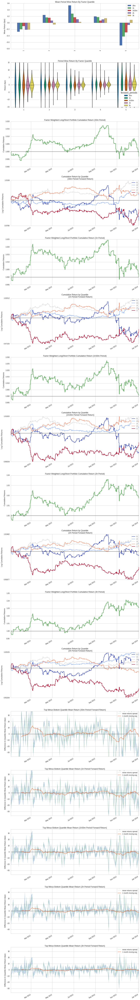

Information Analysis


,30m,1h,1h30m,2h,3h
IC Mean,0.001,0.004,0.004,0.010,0.013
IC Std.,0.099,0.111,0.112,0.112,0.116
Risk-Adjusted IC,0.010,0.039,0.037,0.086,0.111
t-stat(IC),0.164,0.626,0.580,1.359,1.768
p-value(IC),0.870,0.532,0.563,0.175,0.078
IC Skew,-0.262,-0.268,-0.148,-0.139,-0.123
IC Kurtosis,0.609,0.971,0.557,0.586,0.182


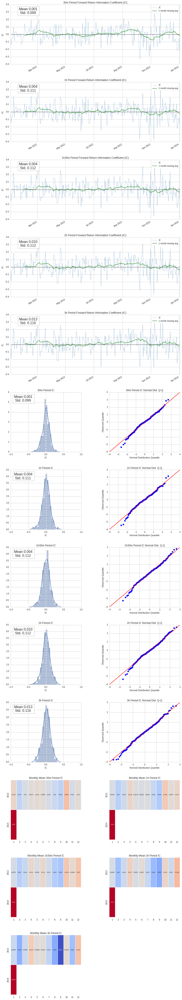

Turnover Analysis


,1h,1h30m,2h,30m,3h
Quantile 1 Mean Turnover,0.0,0.0,0.0,0.0,0.0
Quantile 2 Mean Turnover,0.0,0.0,0.0,0.0,0.0
Quantile 3 Mean Turnover,0.0,0.0,0.0,0.0,0.0
Quantile 4 Mean Turnover,0.0,0.0,0.0,0.0,0.0
Quantile 5 Mean Turnover,0.0,0.0,0.0,0.0,0.0


,30m,1h,1h30m,2h,3h
Mean Factor Rank Autocorrelation,1.0,1.0,1.0,1.0,1.0


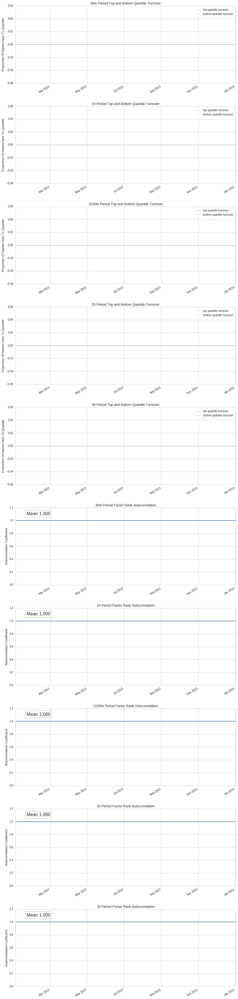

In [ ]:
al.tears.create_full_tear_sheet(intraday_factor_data)

#  Event Study with Alphalens

Alphelens can also be used to perform an event study. An event study is a statistical method to assess the impact of a particular event on the value of a stock. For example we might want to evalute what happens to stocks whose price fall below 5$. While this example seems naive, there are real world trading decisions that depend on events or the events can be used as a trading strategy itself. Here are some examples of events you might want to research usign Alphalens event study:
- [Reversals During Earnings Announcements](https://www.quantopian.com/posts/quantpedia-trading-strategy-series-reversal-during-earnings-announcements)
- [Are Earnings Predictable with Buyback Announcements](https://www.quantopian.com/posts/quantpedia-trading-strategy-series-are-earnings-predictable)
- [An Empirical Algorithmic Evaluation of Technical Analysis](https://www.quantopian.com/posts/an-empirical-algorithmic-evaluation-of-technical-analysis)
- [Reversals in the PEAD](https://www.quantopian.com/posts/quantpedia-trading-strategy-series-reversals-in-the-pead)
- [Mergers and Acquisitions](https://www.quantopian.com/posts/announcing-mergers-and-acquisitions-available-through-pipeline)
- [Driven to Distraction: Extraneous Events and Underreaction to Earnings News](https://www.quantopian.com/posts/backtesting-and-discussion-of-driven-to-distraction-paper)


Some of those examples use algorithms to test their hypothesis, some others use custom NBs. Looking at  different testing methods makes clear the advantage of having a standard tool hat can be used to understand the effects of those events. This not only makes the researching process easier, but it also avoid the problem of lookahead bias, which is a all time present issue in finance.


Let's consider the example from above, the event of a stock price falling below 5$

Alphalens calculates statistics for those dates where the input factor has values (not NaN). To compute the performace analysis on specific dates and securities (like an event study)  we have to make sure the input DataFrame contains valid values only on those date/security combinations where the event happens. All the other values in the DataFrame must be NaN or not present.

Also, make sure the event values are positive (it doesn't matter the value but they must be positive) if you intend to go long on the events and use negative values if you intent to go short. This impacts the cumulative returns plots.

Let's create the event DataFrame where we "mark" (any value) each day a security price fall below 5$.

In [ ]:
class HistoricalClose(CustomFactor):
    inputs = [USEquityPricing.close]
    window_length = 2

    def compute(self, today, assets, out, close):
        out[:] = close[0]

event_mask = (USEquityPricing.close.latest < 5) & (HistoricalClose(mask=universe, window_length=2) >= 5)

In [ ]:
pipe = Pipeline(
    columns = {
            'my_event' : event_mask,
    },
    screen=event_mask
)

events = run_pipeline(pipe, '2011-01-01', '2017-01-01')

Since we computed a Pipeline filter instead of a factor the event dataframe contains only boolean values. For this reason we replace the True value with a real number, otherwise we won't be able to run Alphalens.

In [ ]:
events[:] = -1.0 # as this is negative Alphalens will trade the event with short positions
events.head()

my_event
2011-01-05 00:00:00+00:00 Equity(7465 [TGB])        -1.0
                          Equity(35217 [NES])       -1.0
2011-01-10 00:00:00+00:00 Equity(34963 [CSR])       -1.0
2011-01-11 00:00:00+00:00 Equity(19773 [COCO])      -1.0
2011-01-18 00:00:00+00:00 Equity(6317 [ZQK])        -1.0

In [ ]:
asset_list = events.index.levels[1].unique()

In [ ]:
prices = get_pricing(asset_list, start_date='2011-01-01', end_date='2017-03-01', fields='open_price')

We want to have only one  bin/quantile. So we can either use:

```
quantiles = 1
bins      = None
```
or
```
quantiles = None
bins      = 1
```

But please note that in pandas versions before 0.20.0 there were few bugs in panda.qcut and pandas.cut that resulted in ValueError exception to be thrown when identical values were present in the dataframe and 1 quantile/bin was selected. As a workaroung use the bins custom range option that include all your values. E.g.

```
quantiles = None
bins      = [-1000,1000]
```

In [ ]:
event_data = al.utils.get_clean_factor_and_forward_returns(events,
                                                           prices,
                                                           quantiles=None,
                                                           bins=[-10,10], # bug in pandas explained above
                                                           periods=(1, 2, 3, 4, 5, 6, 10),
                                                           filter_zscore=None)

Dropped 0.1% entries from factor data: 0.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


In [ ]:
event_data.head()

1D        2D        3D  \
date                      asset                                                
2011-01-05 00:00:00+00:00 Equity(7465 [TGB])   -0.012146 -0.004049  0.026316   
                          Equity(35217 [NES])   0.006061  0.034343  0.034343   
2011-01-10 00:00:00+00:00 Equity(34963 [CSR])  -0.034205 -0.024145 -0.012072   
2011-01-11 00:00:00+00:00 Equity(19773 [COCO]) -0.018789 -0.031315  0.050104   
2011-01-18 00:00:00+00:00 Equity(6317 [ZQK])   -0.010020 -0.074148 -0.078156   

                                                      4D        5D        6D  \
date                      asset                                                
2011-01-05 00:00:00+00:00 Equity(7465 [TGB])    0.093117  0.214575  0.176113   
                          Equity(35217 [NES])   0.050505  0.066667  0.088889   
2011-01-10 00:00:00+00:00 Equity(34963 [CSR])  -0.028169  0.000000 -0.024145   
2011-01-11 00:00:00+00:00 Equity(19773 [COCO])  0.062630  0.064718  0.027140   
2011-01-18 00:00:00+00:00 Equity(6317 [ZQK])   -0.118236 -0.128257 -0.098196   

                                                     10D  factor  \
date                      asset                                    
2011-01-05 00:00:00+00:00 Equity(7465 [TGB])    0.151822    -1.0   
                          Equity(35217 [NES])   0.016162    -1.0   
2011-01-10 00:00:00+00:00 Equity(34963 [CSR])  -0.010060    -1.0   
2011-01-11 00:00:00+00:00 Equity(19773 [COCO])  0.162839    -1.0   
2011-01-18 00:00:00+00:00 Equity(6317 [ZQK])   -0.094188    -1.0   

                                                factor_quantile  
date                      asset                                  
2011-01-05 00:00:00+00:00 Equity(7465 [TGB])                  1  
                          Equity(35217 [NES])                 1  
2011-01-10 00:00:00+00:00 Equity(34963 [CSR])                 1  
2011-01-11 00:00:00+00:00 Equity(19773 [COCO])                1  
2011-01-18 00:00:00+00:00 Equity(6317 [ZQK])                  1

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-1.0,-1.0,-1.0,0.0,1846,100.0


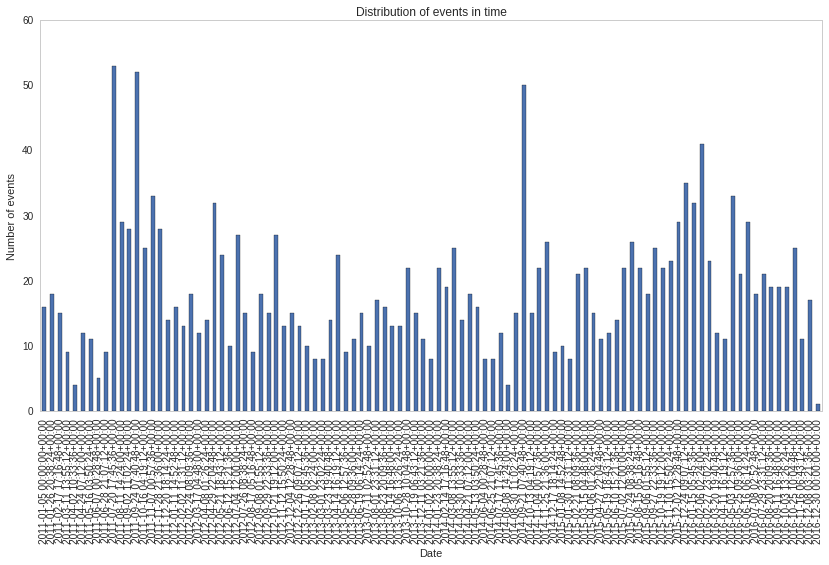

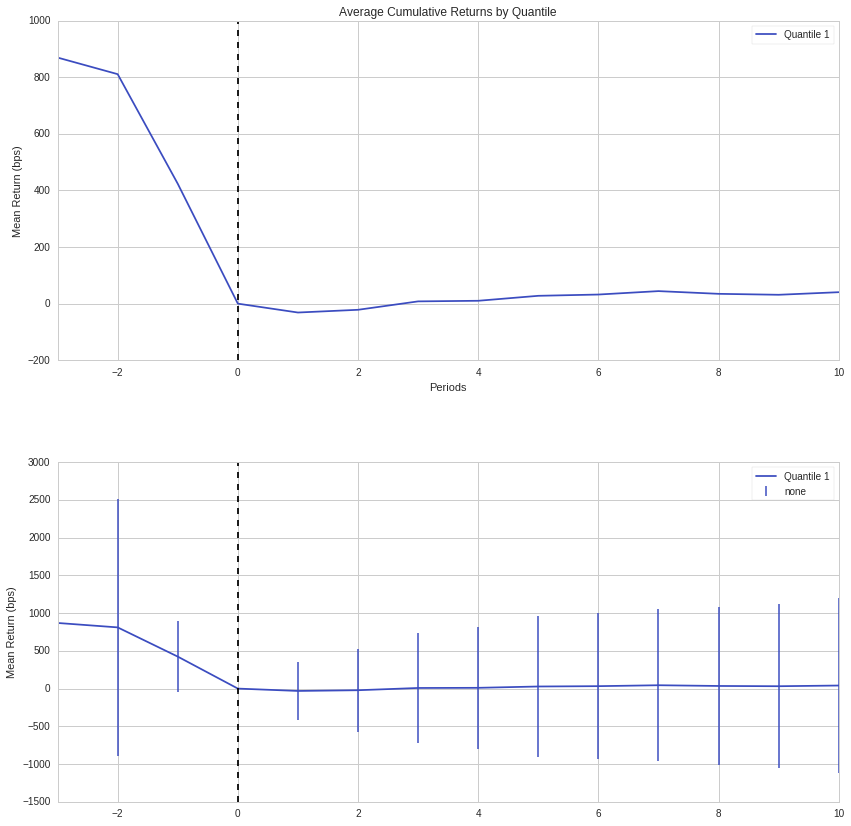

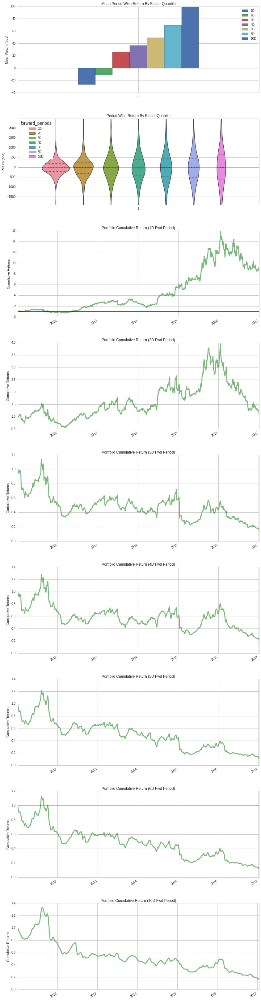

In [ ]:
al.tears.create_event_study_tear_sheet(event_data,
                                       prices,
                                       avgretplot=(3, 10),
                                       rate_of_ret=False,
                                       n_bars=100)

The "Distribution of events in time" plot shows when and how many times the event happened and it is useful to detect anomalies (e.g. are the events distributed equally? Is it a cyclical event? is the event disappearing in recent times?) and to understand how often we expect to trade this signal.

The "Average Cumulative Returns by Quantile" plot shows an overview of the factor performance few days before and few days after (avgretplot=(3,10)) the factor signal and it is plot two times, the second one shows the the standard deviation of the returns. This plot is properly explained in the paragraph "Understanding Alphalens Report part 1: Event-Study-Like Return".

The "Mean Period Wise Return By Factor Quantile" plot tells us what return we would have made on average if we had held the  securities that generated the event for different time periods. This is explained in "Understanding Alphalens Report part 2: Returns Analysis". The option `rate_of_ret` allows to select between the rate of return and actual return. The rate of return allow to compare returns happening at different time frequency but it is not useful when an event doesn't happen frequently and it probably makes more sense to look at the actual return in this case.

The "Period Wise Return By Factor Quantile" violin plot show the information of the previous plot but this time we can see the full distribution of forward returns. Looking at the variance of the return distribution is useful to have a sense of how noisy the event is, that is how  confident we can be on the mean forward returns seen in the previous plot.

The "Portfolio Cumulative Return" plot is straightforward and it shows what the performance of a portfolio would be if it traded this event at different time periods.

## 알파렌즈를 사용한 신호와 잡음 분리

### 미래 수익률과 팩터 분위수의 생성

### 06_performance_eval_alphalens.ipynb
- zipline 코드 실행 결과물이 없어서 실행 불가능

# Separating signal and noise – how to use alphalens

Quantopian은 알파렌즈(Alphalens)라는 Python 라이브러리를 개방 소스로 공개하였으며, 이는 예측 주식 팩터의 성능 분석에 잘 통합되는 zipline 백테스팅 라이브러리와 포트폴리오 성과 및 리스크 분석 라이브러리인 pyfolio와 함께 사용됩니다. 이에 대해서는 다음 장에서 살펴보겠습니다.
알파렌즈는 다음과 같은 측면에서 알파 팩터의 예측력 분석을 용이하게 해줍니다:
- 신호와 후속 수익의 상관관계
- (부분적인) 신호를 기반으로 한 동일 가중치 또는 팩터 가중치 포트폴리오의 수익성
- 팩터의 턴오버를 통해 잠재적인 거래 비용을 나타냄
- 특정 이벤트 기간 동안의 팩터 성능
- 섹터별로 분류된 이전 분석 결과

해당 분석은 티어시트(tearsheet) 또는 개별 계산 및 그래프를 통해 수행할 수 있습니다.

> 이 노트북은 `conda` 환경 `backtest`을 요구합니다. 최신 Docker 이미지를 실행하거나 환경을 설정하는 대체 방법에 대한 설치 지침을 보려면 [설치 지침](../installation/README.md)을 참조하십시오.

## Imports & Settings

In [37]:
import warnings
warnings.filterwarnings('ignore')

In [38]:
%matplotlib inline
import re
from alphalens.utils import get_clean_factor_and_forward_returns
from alphalens.performance import *
from alphalens.plotting import *
from alphalens.tears import *

import seaborn as sns
import matplotlib.pyplot as plt

In [39]:
sns.set_style('whitegrid')

## Creating forward returns and factor quantiles
- 미래 수익률과 팩터 분위수의 생성

`알파렌즈`를 활용하기 위해서는 주어진 보유 기간 동안 자산에 투자하여 얻은 전방 수익률과 같이 자산 집합을 위한 신호를 제공해야 합니다.

> 이 노트북은 이 디렉토리에 있는 `single_factor_zipline.ipynb` 노트북에서 생성된 결과인 `single_factor.pickle` 파일을 사용합니다.

우리는 다음과 같이 `single_factor.pickle` 파일에서 가격을 복구할 것입니다 (`factor_data`도 동일하게)


 `single_factor.pickle` 파일을 읽어들이고, 데이터에서 가격을 가져옵니다. 또한, 팩터 데이터를 가져옵니다.

In [40]:
performance = pd.read_pickle('single_factor.pickle')

FileNotFoundError: ignored

In [ ]:
performance.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 755 entries, 2015-01-02 21:00:00+00:00 to 2017-12-29 21:00:00+00:00
Data columns (total 39 columns):
 #   Column                   Non-Null Count  Dtype              
---  ------                   --------------  -----              
 0   period_open              755 non-null    datetime64[ns, UTC]
 1   period_close             755 non-null    datetime64[ns, UTC]
 2   shorts_count             755 non-null    int64              
 3   long_value               755 non-null    float64            
 4   short_value              755 non-null    float64            
 5   long_exposure            755 non-null    float64            
 6   pnl                      755 non-null    float64            
 7   capital_used             755 non-null    float64            
 8   short_exposure           755 non-null    float64            
 9   orders                   755 non-null    object             
 10  transactions             755 non-null    object  

In [ ]:
prices = pd.concat([df.to_frame(d) for d, df in performance.prices.dropna().items()],axis=1).T
prices.columns = [re.findall(r"\[(.+)\]", str(col))[0] for col in prices.columns]
prices.index = prices.index.normalize()
prices.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 754 entries, 2015-01-05 00:00:00+00:00 to 2017-12-29 00:00:00+00:00
Columns: 1649 entries, A to NETE
dtypes: float64(1649)
memory usage: 9.5 MB


In [ ]:
factor_data = pd.concat([df.to_frame(d) for d, df in performance.factor_data.dropna().items()],axis=1).T
factor_data.columns = [re.findall(r"\[(.+)\]", str(col))[0] for col in factor_data.columns]
factor_data.index = factor_data.index.normalize()
factor_data = factor_data.stack()
factor_data.index.names = ['date', 'asset']
factor_data.head()

date                       asset
2015-01-05 00:00:00+00:00  A        2707.0
                           AAL       870.0
                           AAP      1253.0
                           AAPL     2977.0
                           ABBV     2806.0
dtype: float64

In [ ]:
with pd.HDFStore('../data/assets.h5') as store:
    sp500 = store['sp500/stooq'].close
sp500 = sp500.resample('D').ffill().tz_localize('utc').filter(prices.index.get_level_values(0))
sp500.head()

Date
2015-01-05 00:00:00+00:00    2020.58
2015-01-06 00:00:00+00:00    2002.61
2015-01-07 00:00:00+00:00    2025.90
2015-01-08 00:00:00+00:00    2062.14
2015-01-09 00:00:00+00:00    2044.81
Name: close, dtype: float64


`get_clean_factor_and_forward_returns` 유틸리티 함수를 사용하여 필요한 형식의 알파렌즈 입력 데이터를 생성할 수 있습니다. 이 함수는 신호 사분위수와 주어진 보유 기간에 대한 전방 수익률도 반환합니다.

In [ ]:
HOLDING_PERIODS = (5, 10, 21, 42)
QUANTILES = 5
alphalens_data = get_clean_factor_and_forward_returns(factor=factor_data,
                                                      prices=prices,
                                                      periods=HOLDING_PERIODS,
                                                      quantiles=QUANTILES)

Dropped 5.6% entries from factor data: 5.6% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


The `alphalens_data` `DataFrame` contains the returns on an investment in the given asset on a given date for the indicated holding period, as well as the factor value, that is, the asset's `MeanReversion` ranking on that date, and the corresponding quantile value:

In [ ]:
alphalens_data.head()

5D       10D       21D       42D  \
date                      asset                                           
2015-01-05 00:00:00+00:00 A      0.007789 -0.046985 -0.027889  0.072864   
                          AAL   -0.079722 -0.020882 -0.095684 -0.103295   
                          AAP    0.015722 -0.024350 -0.003196 -0.010865   
                          AAPL   0.028235  0.023247  0.116518  0.214965   
                          ABBV   0.017169 -0.018561 -0.061098 -0.064811   

                                 factor  factor_quantile  
date                      asset                           
2015-01-05 00:00:00+00:00 A      2707.0                5  
                          AAL     870.0                1  
                          AAP    1253.0                2  
                          AAPL   2977.0                5  
                          ABBV   2806.0                5

In [ ]:
alphalens_data.reset_index().head().to_csv('factor_data.csv', index=False)

The forward returns and the signal quantiles are the basis for evaluating the predictive power of the signal. Typically, a factor should deliver markedly different returns for distinct quantiles, such as negative returns for the bottom quintile of the factor values and positive returns for the top quantile.

## Summary Tear Sheet

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,1.0,1011.0,303.057978,188.562449,142313,20.020145
2,352.0,1636.0,856.678631,234.705707,142117,19.992572
3,794.0,2153.0,1417.174265,259.942787,142019,19.978786
4,1273.0,2621.0,1979.178578,253.504821,142117,19.992572
5,1827.0,3050.0,2519.578804,227.348609,142283,20.015925


Returns Analysis


,5D,10D,21D,42D
Ann. alpha,0.046,0.036,0.009,0.001
beta,0.083,0.098,0.077,0.019
Mean Period Wise Return Top Quantile (bps),11.724,9.110,3.948,-0.376
Mean Period Wise Return Bottom Quantile (bps),-16.862,-13.259,-4.742,-1.979
Mean Period Wise Spread (bps),28.587,22.343,8.711,1.582


Information Analysis


,5D,10D,21D,42D
IC Mean,0.022,0.026,0.017,0.003
IC Std.,0.140,0.127,0.116,0.115
Risk-Adjusted IC,0.160,0.207,0.148,0.027
t-stat(IC),4.261,5.529,3.953,0.729
p-value(IC),0.000,0.000,0.000,0.466
IC Skew,0.372,0.266,0.115,0.113
IC Kurtosis,0.054,-0.515,-0.333,-0.557


Turnover Analysis


,5D,10D,21D,42D
Quantile 1 Mean Turnover,0.411,0.590,0.830,0.831
Quantile 2 Mean Turnover,0.645,0.740,0.804,0.812
Quantile 3 Mean Turnover,0.679,0.765,0.808,0.812
Quantile 4 Mean Turnover,0.642,0.741,0.810,0.814
Quantile 5 Mean Turnover,0.394,0.569,0.811,0.819


,5D,10D,21D,42D
Mean Factor Rank Autocorrelation,0.713,0.454,-0.013,-0.017


<Figure size 432x288 with 0 Axes>

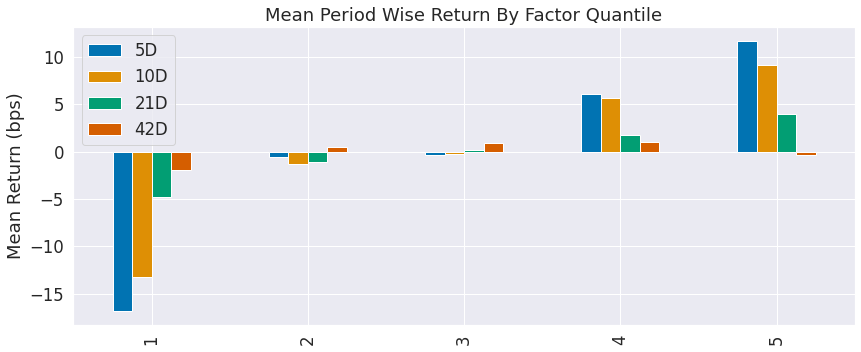

In [ ]:
create_summary_tear_sheet(alphalens_data)

## Predictive performance by factor quantiles -  Returns Analysis
- 팩터 5분위수에 대한 예측 성과

첫 번째 단계로, 우리는 팩터 사분위별로 평균 기간 수익률을 시각화하고자 합니다. 성과 모듈의 `mean_return_by_quantile` 내장 함수와 플로팅팅 모듈의 `plot_quantile_returns_bar` 함수를 사용할 수 있습니다.

In [ ]:
mean_return_by_q, std_err = mean_return_by_quantile(alphalens_data)
mean_return_by_q_norm = mean_return_by_q.apply(lambda x: x.add(1).pow(1/int(x.name[:-1])).sub(1))

### Mean Return by Holding Period and Quintile

결과는 팩터 신호의 사분위별로 다른 보유 기간에 대한 전방 수익률의 평균을 나타내는 막대형 차트입니다. 볼 수 있듯이, 가장 짧은 보유 기간을 제외하고는 하위 사분위는 상위 사분위에 비해 현저히 부정적인 결과를 나타내고 있습니다.

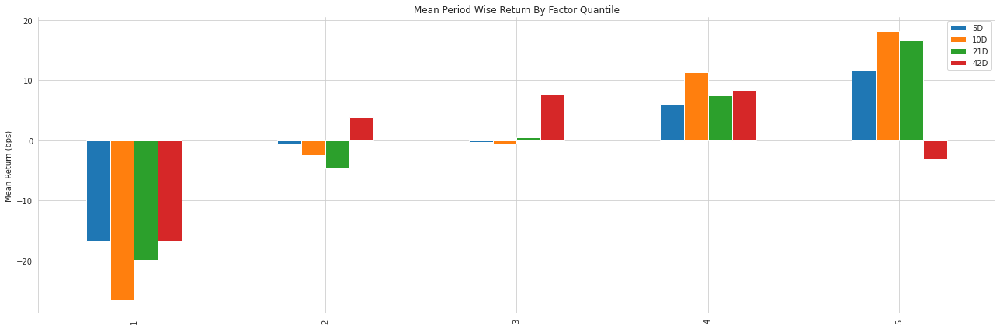

In [ ]:
plot_quantile_returns_bar(mean_return_by_q)
plt.tight_layout()
sns.despine();


10일 보유 기간은 첫 번째와 네 번째 사분위에 약간 더 좋은 결과를 제공합니다. 또한, 신호 사분위별로 주도된 투자의 성과를 시간에 따라 확인하고자 합니다.

5일 보유 기간에 대해 일별 수익률을 계산하고, 알파렌즈는 일별 신호와 더 긴 보유 기간 간의 불일치를 고려하여 기간 수익률을 조정할 것입니다 (자세한 내용은 문서를 참조하십시오).

In [ ]:
mean_return_by_q_daily, std_err = mean_return_by_quantile(alphalens_data, by_date=True)

### Cumulative 5D Return

The resulting line plot shows that, for most of this three-year period, the top two quintiles significantly outperformed the bottom two quintiles. However, as suggested by the previous plot, signals by the fourth quintile produced a better performance than those by the top quintile

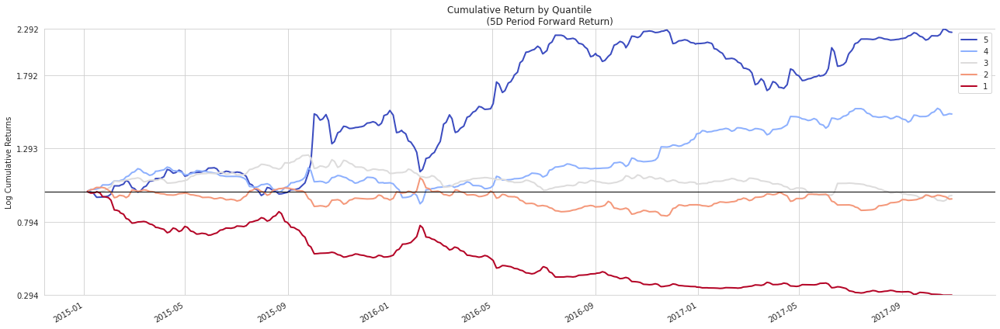

In [ ]:
plot_cumulative_returns_by_quantile(mean_return_by_q_daily['5D'], period='5D', freq=None)
plt.tight_layout()
sns.despine();

### Return Distribution by Holding Period and Quintile

This distributional plot highlights that the range of daily returns is fairly wide and, despite different means, the separation of the distributions is very limited so that, on any given day, the differences in performance between the different quintiles may be rather limited:

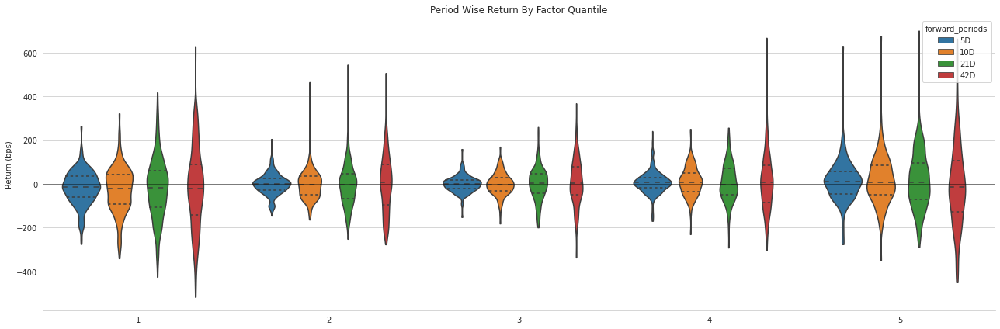

In [ ]:
plot_quantile_returns_violin(mean_return_by_q_daily)
plt.tight_layout()
sns.despine();

## Information Coefficient
- 정보 계수

이 책의 대부분은 ML 모델을 사용하여 알파 팩터를 설계하는 것에 관한 내용입니다. ML은 예측적 목표를 최적화하는 것이며, 이 섹션에서는 알파 팩터의 성능을 측정하는 데 사용되는 주요 지표를 소개하겠습니다.


알파를 기준 대비 평균 수익으로 정의하고, 이로 인해 정보비율(IR)이라는 지표가 생성됩니다. 정보비율은 알파를 추적 리스크로 나누어 평균 초과 수익을 위험 단위로 측정하는 지표입니다.

리스크-무위험 이자율이 기준인 경우, 정보비율은 잘 알려진 샤프 지수에 해당하며, 수익률이 정규 분포를 따르지 않는 일반적인 경우에 발생하는 중요한 통계 측정 문제를 강조할 것입니다. 또한, 액티브 관리의 기본 법칙에 대해 설명할 것인데, 이는 정보비율을 예측 기술의 조합과 전략이 예측 기술을 효과적으로 이용하는 능력으로 분해합니다.

### 5D Information Coefficient (Rolling Average)

알파 팩터의 목표는 미래 수익의 정확한 방향성 예측입니다. 따라서 알파 팩터의 예측과 대상 자산의 전방 수익과의 상관관계는 자연스러운 성능 측정 지표입니다.

선형 관계의 강도를 측정하는 피어슨 상관관계와는 달리, 두 변수 사이의 관계를 단조 함수로 얼마나 잘 설명할 수 있는지 측정하는 비모수적인 스피어만 순위 상관계수를 사용하는 것이 더 좋습니다.

알파렌즈를 사용하여 정보 계수를 얻을 수 있으며, 이는 내부적으로 scipy.stats.spearmanr을 사용합니다.

`factor_information_coefficient` 함수는 기간별 상관관계를 계산하고, `plot_ic_ts`는 월 이동 평균을 사용한 시계열 그래프를 생성합니다:


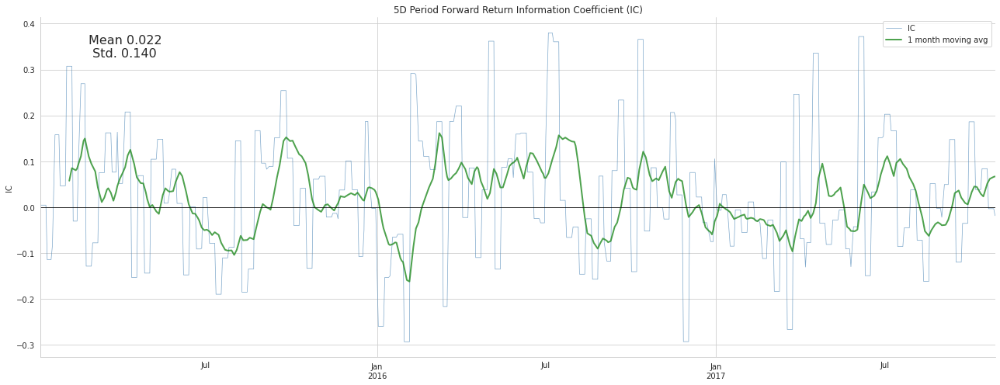

In [ ]:
ic = factor_information_coefficient(alphalens_data)
plot_ic_ts(ic[['5D']])
plt.tight_layout()
sns.despine();

### Information Coefficient by Holding Period

이 시계열 그래프는 이동 평균 정보 계수(IC)가 상당히 양의 값을 가지는 연장된 기간을 보여줍니다. 정보 계수가 0.05 또는 0.1인 경우, 이러한 예측 기술을 적용할 충분한 기회가 있다면 상당한 성과를 낼 수 있습니다. 이는 액티브 관리의 기본 법칙이 설명하는 바입니다.

연간 평균 IC의 그래프를 살펴보면 해당 팩터의 성능이 역사적으로 불규칙하다는 것을 강조합니다.

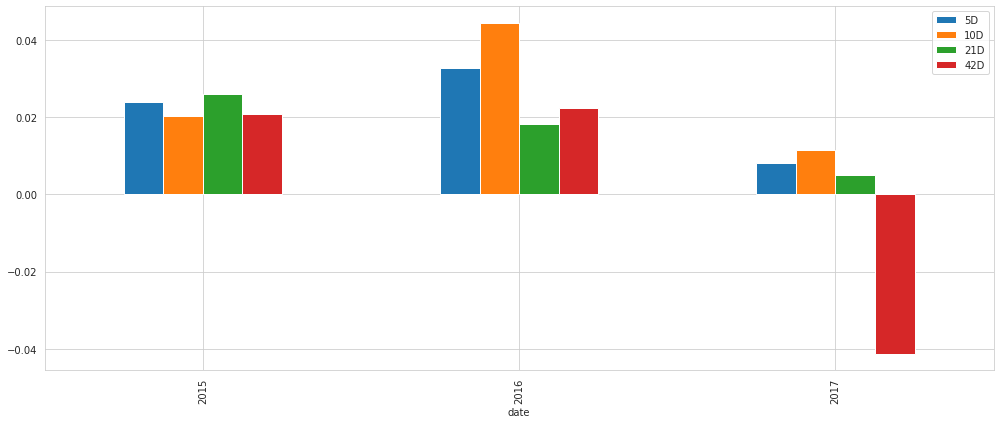

In [ ]:
ic = factor_information_coefficient(alphalens_data)
ic_by_year = ic.resample('A').mean()
ic_by_year.index = ic_by_year.index.year
ic_by_year.plot.bar(figsize=(14, 6))
plt.tight_layout();

## Turnover Tear Sheet
- 팩터 회전율

팩터 회전율은 특정 사분위수와 연결된 자산이 얼마나 자주 변경되는지, 즉 포트폴리오를 신호의 순서에 맞게 조정하기 위해 몇 번의 거래가 필요한지를 측정합니다. 구체적으로 말하면, 현재 팩터 사분위수에 있는 자산 중 이전 기간에는 해당 사분위수에 속하지 않았던 자산의 비율을 측정합니다.

Turnover Analysis


,5D,10D,21D,42D
Quantile 1 Mean Turnover,0.411,0.590,0.830,0.831
Quantile 2 Mean Turnover,0.645,0.740,0.804,0.812
Quantile 3 Mean Turnover,0.679,0.765,0.808,0.812
Quantile 4 Mean Turnover,0.642,0.741,0.810,0.814
Quantile 5 Mean Turnover,0.394,0.569,0.811,0.819


,5D,10D,21D,42D
Mean Factor Rank Autocorrelation,0.713,0.454,-0.013,-0.017


<Figure size 432x288 with 0 Axes>

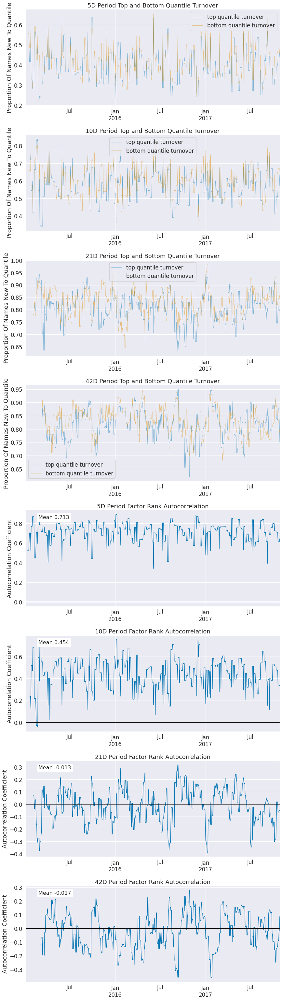

In [ ]:
create_turnover_tear_sheet(alphalens_data);

## 알파 팩터 리소스
### 기타 알고리듬 트레이딩 라이브러리

- [QuantConnect](https://www.quantconnect.com/)
- [Alpha Trading Labs](https://www.alphalabshft.com/)
    - Alpha Trading Labs is no longer active
- [WorldQuant](https://www.worldquantvrc.com/en/cms/wqc/home/)
- Python Algorithmic Trading Library [PyAlgoTrade](http://gbeced.github.io/pyalgotrade/)
- [pybacktest](https://github.com/ematvey/pybacktest)
- [Trading with Python](http://www.tradingwithpython.com/)
- [Interactive Brokers](https://www.interactivebrokers.com/en/index.php?f=5041)
